<a href="https://colab.research.google.com/github/AishaEvering/Art_Geek/blob/main/Art_Geek.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Art Geek


![header](https://drive.google.com/uc?export=view&id=1yd0E6pXMrN-NWy9wUDhTRFDzaC0g5g3r)

### Project Overview

In this project, I will train neural network models to classify artwork based on a combination of their characteristics. The models will be developed using a diverse dataset from [Hugging Face](https://huggingface.co/datasets/huggan/wikiart), which provides a rich collection of artwork across various categories.

Although the problem has mulitple labels, each label has multiple classes so the problem is a **multi-class classification** problem. Unlike traditional single-class classification, this approach involves predicting multiple aspects of each artwork. Each artwork will be assigned a set of labels, providing a comprehensive understanding of its characteristics.

### Key Objectives

- **Develop and Train Neural Networks**: Fine-tune models to accurately classify artworks into multiple categories.
- **Handle Multi-Class Classification**: Implement techniques for multi-class classification to predict different aspects the artwork simultaneously.
- **Leverage a Diverse Dataset**: Utilize the [WikiArt dataset](https://huggingface.co/datasets/huggan/wikiart) from Hugging Face to ensure a broad and representative range of artwork samples.

### Project Details

1. **Dataset**: The [WikiArt dataset](https://huggingface.co/datasets/huggan/wikiart) from Hugging Face provides a vast collection of artworks categorized by artist, genre, and style.
   
2. **Task**: Develop models to classify artworks into multiple categories, which may or may not include predicting:
   - **Artist**: The creator of the artwork.
   - **Genre**: The genre of the artwork.
   - **Style**: The artistic style used in the artwork.

3. **Approach**:
   - **EDA**: Get to know the data and determine is the task at hand is feasible.
   - **Data Preparation**: Preprocess and augment the dataset to enhance model performance.
   - **Model Training**: Train and optimize neural network models for multi-label classification.
   - **Evaluation**: Assess the model's performance using appropriate multi-label metrics.


## Project Preperation

In [3]:
!pip3 -qqq install datasets
!pip3 -qqq install torchinfo
!pip3 -qqq install tqdm
!pip3 -qqq install kaleido
!pip3 -qqq install pillow torchvision

In [4]:
import os
import random
from PIL import Image
import pandas as pd
from pathlib import Path
import torch
import torchvision
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from datasets import load_dataset, Dataset
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

%matplotlib inline

In [132]:
IMAGE_SIZE = (288, 288)
BATCH_SIZE = 32
SEED = 42
EPOCHS = 20
THRESHOLDS = [0.6, 0.7, 0.8]
BEST_THRESHOLD = 0.7
ROOT = Path('dir')

device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [6]:
# Set seeds
def set_seeds(seed: int=SEED):
    """Sets random sets for torch operations.

    Args:
        seed (int, optional): Random seed to set. Defaults to 42.
    """
    # Set the seed for general torch operations
    torch.manual_seed(seed)
    # Set the seed for CUDA torch operations (ones that happen on the GPU)
    torch.cuda.manual_seed(seed)

## Load Data

Downloading **100%** of the data. Getting a look at all the data from the start will give me more of an idea on what the models might have more success in predicting.  

In [8]:
ds = load_dataset('huggan/wikiart', split='train')
ds

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Resolving data files:   0%|          | 0/72 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/45 [00:00<?, ?it/s]

Dataset({
    features: ['image', 'artist', 'genre', 'style'],
    num_rows: 81444
})

In [9]:
# create initial annotations dataframe
full_annotations = ds.to_pandas()

full_annotations.drop('image', axis=1, inplace=True)

# add the image names
full_annotations['image_name'] = [f'image_{idx}.jpg' for idx in range(len(full_annotations))]

full_annotations.head()

,artist,genre,style,image_name
0,22,4,21,image_0.jpg
1,20,7,4,image_1.jpg
2,16,6,20,image_2.jpg
3,17,2,12,image_3.jpg
4,9,10,23,image_4.jpg


In [10]:
def format_class_name(label:list[str]) -> list[str]:
  """
  Formats and cleans the class names by replacing underscores and hyphens with spaces and capitalizing each word.

  Args:
      labels (list[str]): A list of class name strings to be formatted.

  Returns:
      list[str]: A list of formatted class name strings.
  """
  return [item.replace('_', ' ').replace('-', ' ').title() for item in label]

In [11]:
# format class labels
genres = format_class_name(ds.features['genre'].names)
styles = format_class_name(ds.features['style'].names)
artists = format_class_name(ds.features['artist'].names)

In [12]:
# add artist, genre, and style names
full_annotations['artist_name'] = full_annotations['artist'].map(lambda x: artists[x])
full_annotations['genre_name'] = full_annotations['genre'].map(lambda x: genres[x])
full_annotations['style_name'] = full_annotations['style'].map(lambda x: styles[x])
full_annotations.head()

,artist,genre,style,image_name,artist_name,genre_name,style_name
0,22,4,21,image_0.jpg,Vincent Van Gogh,Landscape,Realism
1,20,7,4,image_1.jpg,Rembrandt,Religious Painting,Baroque
2,16,6,20,image_2.jpg,Paul Cezanne,Portrait,Post Impressionism
3,17,2,12,image_3.jpg,Pierre Auguste Renoir,Genre Painting,Impressionism
4,9,10,23,image_4.jpg,Ivan Aivazovsky,Unknown Genre,Romanticism


## EDA (Exploratory Data Analysis)


Some of the things I looking for during EDA are...

* Is the data balanced across each label, artist, genre, and style?
* What is the most/least common genre?
* What is the most/least common style?
* Who is the most/least common artist?
  
Understanding these details about the data will provide deeper insights and help set expectations for the performance of the trained models.

In [13]:
plots_dir = ROOT / 'plots/'
if not plots_dir.is_dir():
  plots_dir.mkdir(parents=True, exist_ok=True)

print(plots_dir)

dir/plots


In [11]:
def save_plotly_plot(plot_fig, root_dir=plots_dir):
  name = plot_fig.layout.title.text.replace(' ','_').lower() + ".png"

  plot_name = root_dir / name
  plot_fig.write_image(plot_name)
  print(f'Saved plot to {plot_name}')
  plot_fig.show()
  return plot_name

Saved plot to dir/plots/number_of_art_pieces_by_artist.png


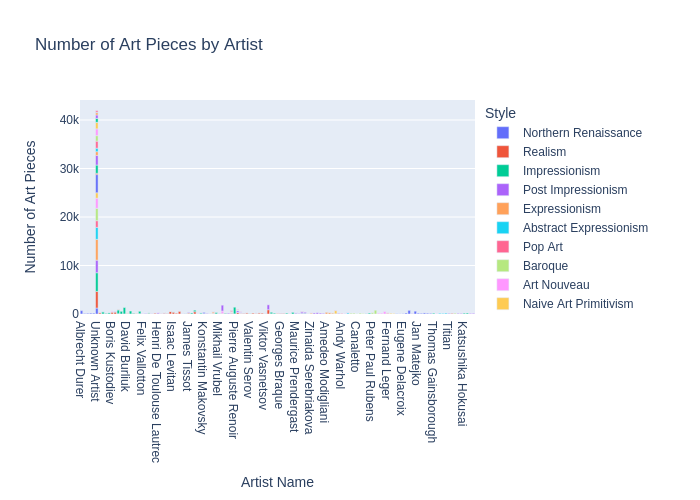

In [12]:
group = full_annotations.groupby(by=['artist_name','style_name']).size().reset_index(name='counts')

fig = px.bar(group, x='artist_name', y='counts', color='style_name',
             labels={'counts':'Number of Art Pieces','artist_name':'Artist Name', 'style_name': 'Style'},
             title="Number of Art Pieces by Artist")

Image.open(save_plotly_plot(fig))

**Insights**

* The data is extremely imbalanced towards unknown artists.

Saved plot to dir/plots/imbalanced_data_by_artist.png


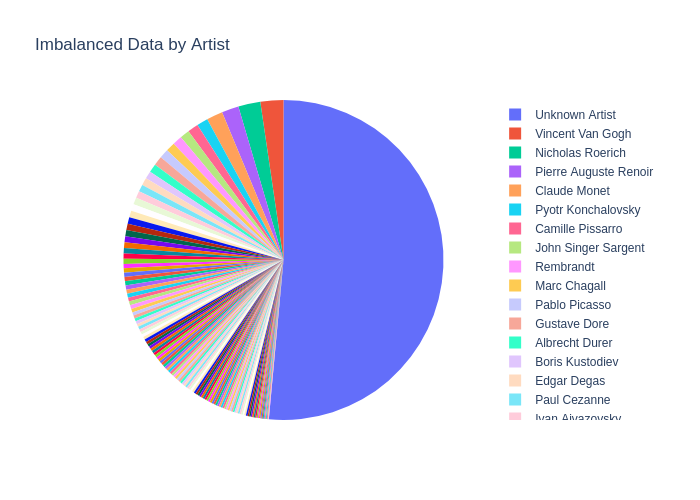

In [13]:
group = full_annotations.groupby(by=['artist_name']).size().reset_index(name='counts')

fig = px.pie(group, values='counts', names='artist_name',title="Imbalanced Data by Artist")
fig.update_traces(hoverinfo='label+percent+name', textinfo='none')

Image.open(save_plotly_plot(fig))

**Insights**

* More than half of the data is from unknown artists.
* There a lot of artist with very little artwork.


Saved plot to dir/plots/art_pieces_by_known_artists.png


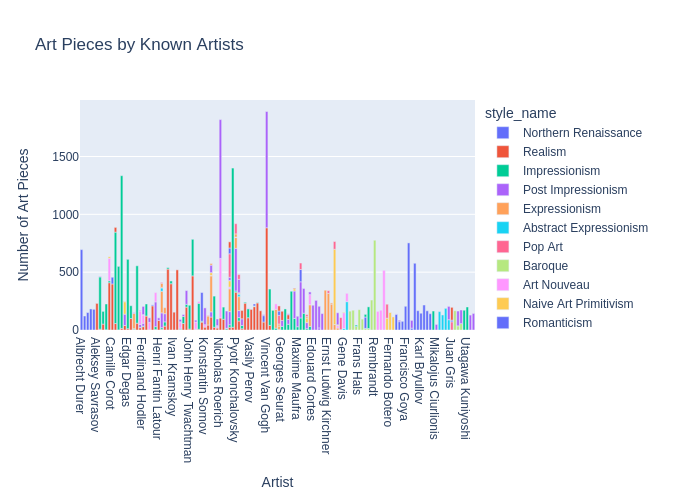

In [14]:
df_known_artist = full_annotations[~full_annotations['artist_name'].isin(['Unknown Artist'])]
known_artist = df_known_artist.groupby(by=['artist_name','style_name']).size().reset_index(name='counts')

fig = px.bar(known_artist, x='artist_name', y='counts', color='style_name',
             labels={'counts':'Number of Art Pieces','artist_name':'Artist'},
             title="Art Pieces by Known Artists")

Image.open(save_plotly_plot(fig))

Saved plot to dir/plots/art_pieces_by_unknown_artists.png


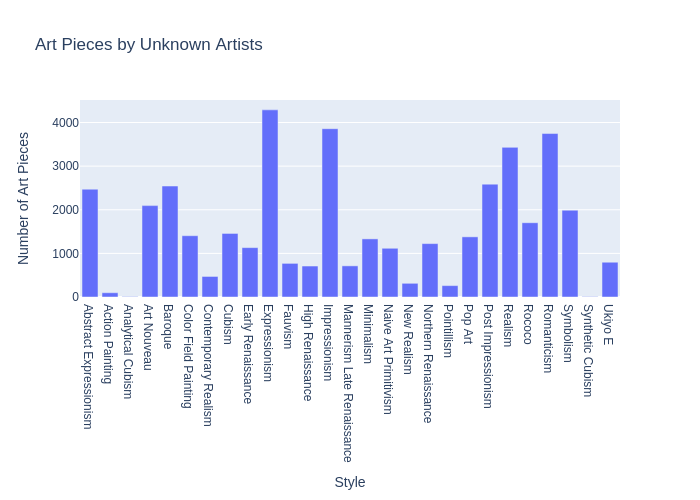

In [15]:
df_unknown_artist = full_annotations[full_annotations['artist_name'].isin(['Unknown Artist'])]
unknown_artist = df_unknown_artist.groupby(by=['artist_name','style_name']).size().reset_index(name='counts')

fig = px.bar(unknown_artist, x='style_name', y='counts',
             labels={'counts':'Number of Art Pieces','style_name':'Style'},
             title="Art Pieces by Unknown Artists")

Image.open(save_plotly_plot(fig))

**Insights**

* The known artist with the most pieces, Vincent Van Gogh, has a maximum of around 2,000 artworks.
*  The top style from an unknown artist exceeds 4,000 pieces.

This significant imbalance will likely affect the model's predictions. To address this, I plan to undersample the artworks from the unknown artist to give the model a better chance of accurately predicting the artist labels.

Saved plot to dir/plots/more_balanced_to_data_by_artist.png


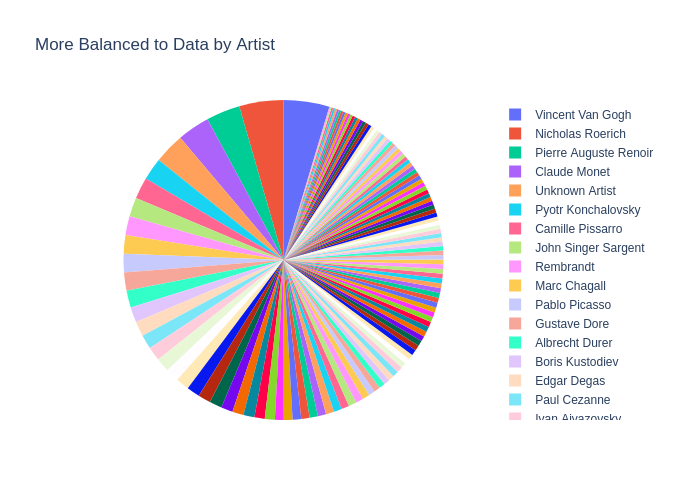

In [16]:
from sklearn.utils import resample

fraction = 0.03

# undersample "Unknown" samples
unknown_artist_undersampled = resample(df_unknown_artist, replace=False,
                                       n_samples=int(len(df_unknown_artist) * fraction),
                                       random_state=42)

balanced_annotations = pd.concat([df_known_artist, unknown_artist_undersampled])

group = balanced_annotations.groupby(by=['artist_name']).size().reset_index(name='counts')

fig = px.pie(group, values='counts', names='artist_name',title="More Balanced to Data by Artist")
fig.update_traces(hoverinfo='label+percent+name', textinfo='none')

Image.open(save_plotly_plot(fig))

In [17]:
print(f'Balanced annotations shape: {balanced_annotations.shape}')

Balanced annotations shape: (40787, 7)


**Insights**

* Despite balancing the data, many artists still have only a small amount of artwork.
*  The models will struggle to accurately predict these artists without significantly more data specific to them.
*  I will not include the artist as part of the labels for the models to predict.

In [18]:
full_annotations.head()

,artist,genre,style,image_name,artist_name,genre_name,style_name
0,22,4,21,image_0.jpg,Vincent Van Gogh,Landscape,Realism
1,20,7,4,image_1.jpg,Rembrandt,Religious Painting,Baroque
2,16,6,20,image_2.jpg,Paul Cezanne,Portrait,Post Impressionism
3,17,2,12,image_3.jpg,Pierre Auguste Renoir,Genre Painting,Impressionism
4,9,10,23,image_4.jpg,Ivan Aivazovsky,Unknown Genre,Romanticism


In [19]:
# removing artists
annotations = full_annotations[['image_name', 'genre','style','genre_name','style_name']].copy()
annotations.head()

,image_name,genre,style,genre_name,style_name
0,image_0.jpg,4,21,Landscape,Realism
1,image_1.jpg,7,4,Religious Painting,Baroque
2,image_2.jpg,6,20,Portrait,Post Impressionism
3,image_3.jpg,2,12,Genre Painting,Impressionism
4,image_4.jpg,10,23,Unknown Genre,Romanticism


Saved plot to dir/plots/distribution_of_art_styles.png


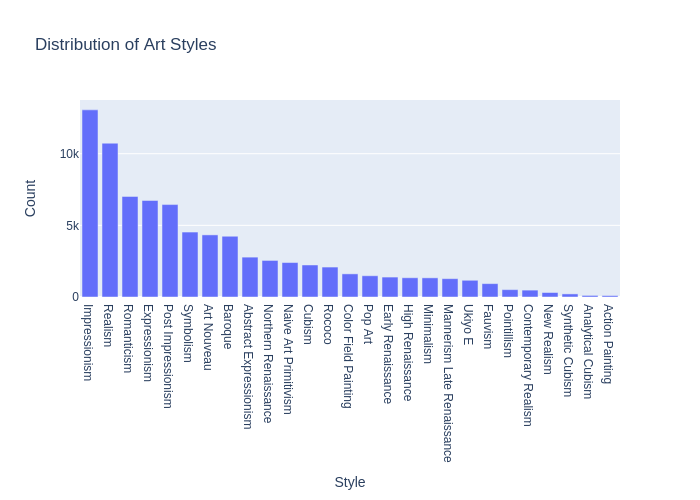

In [20]:
# Count the occurrences of each style
style_counts = full_annotations['style_name'].value_counts()

# Create a bar chart
fig = go.Figure(data=[go.Bar(x=style_counts.index, y=style_counts.values)])

fig.update_layout(
    title='Distribution of Art Styles',
    xaxis_title='Style',
    yaxis_title='Count'
)

Image.open(save_plotly_plot(fig))

**Insights**

* The top three styles are Impressionism, Realism, and Post-Impressionism.
* There are over 13,000 artworks in the Impressionism style, compared to only 98 in Action Painting.
* Styles like Contemporary Realism, New Realism, and Action Painting may be more challenging for the model to predict.
* There is a noticeable bias towards the top styles. To address this, I will adjust the class weights during training.

Saved plot to dir/plots/distribution_of_art_genres.png


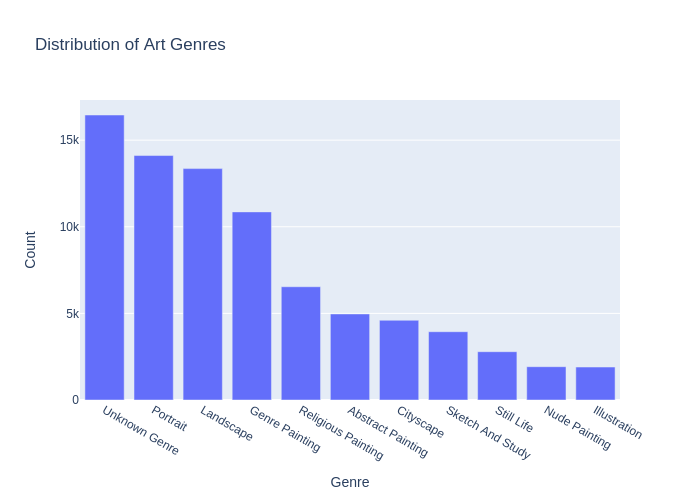

In [21]:
# Count the occurrences of each genre
genre_counts = full_annotations['genre_name'].value_counts()

# Create a bar chart
fig = go.Figure(data=[go.Bar(x=genre_counts.index, y=genre_counts.values)])

fig.update_layout(
    title='Distribution of Art Genres',
    xaxis_title='Genre',
    yaxis_title='Count'
)

Image.open(save_plotly_plot(fig))

**Insights**

* Most of the genres are unknown.
* There are over 16,000 unknown genres compared to the ~2000 Illustration gneres.
* The top genres that are known are Portrait, Landscape, and Genre Painting.
* There is a noticeable bias towards the top genres. To address this, I will adjust the class weights during training.

## Preprocess Data

### Filter Data


In [22]:
# train_test_split breaks for combinations < 2, filtering out those groups for now.

def filter_out_low_value_combos(df, group):
  # calculate value counts for each group (artist, genre, style)
  group_counts = df.groupby(group).size()

  # filter out groups with less than 2 instances
  valid_groups = group_counts[group_counts >= 2].index

  # filter annotations DataFrame based on valid groups
  df_filtered = df[
      df[group].apply(tuple, axis=1).isin(valid_groups)
  ]
  return df_filtered

### Split Data

In [14]:
# train_annotations = pd.read_csv("/content/dir/data/train/train_annotations.csv")
# val_annotations = pd.read_csv("/content/dir/data/val/val_annotations.csv")
# test_annotations = pd.read_csv("/content/dir/data/test/test_annotations.csv")

In [23]:
label_group = ['genre', 'style']

filtered_annotations = filter_out_low_value_combos(full_annotations, label_group)[['image_name', 'genre','style']].copy()

# split dataset into train and temp sets
train_annotations, temp_annotations = train_test_split(
    filtered_annotations, test_size=0.4, stratify=filtered_annotations[label_group]
)

# split temp set into validation and test sets
val_annotations, test_annotations = train_test_split(temp_annotations, test_size=0.2)

train_annotations.shape, val_annotations.shape, test_annotations.shape

((48856, 3), (26057, 3), (6515, 3))

In [24]:
train_annotations.head()

,image_name,genre,style
40496,image_40496.jpg,7,17
63827,image_63827.jpg,6,3
55723,image_55723.jpg,7,4
8997,image_8997.jpg,8,21
63387,image_63387.jpg,6,12


### Encode Labels

In [25]:
# encode labels
train_annotations = pd.get_dummies(train_annotations, columns=['genre','style'], dtype=int)
val_annotations = pd.get_dummies(val_annotations, columns=['genre','style'], dtype=int)
test_annotations = pd.get_dummies(test_annotations, columns=['genre','style'], dtype=int)

train_annotations.head()

,image_name,genre_0,genre_1,genre_2,genre_3,genre_4,genre_5,genre_6,genre_7,genre_8,...,style_17,style_18,style_19,style_20,style_21,style_22,style_23,style_24,style_25,style_26
40496,image_40496.jpg,0,0,0,0,0,0,0,1,0,...,1,0,0,0,0,0,0,0,0,0
63827,image_63827.jpg,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
55723,image_55723.jpg,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
8997,image_8997.jpg,0,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0
63387,image_63387.jpg,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


## Download Annotations & Images

Saving annotations and images to their appropriate directory to make them easier to work with.  I will be following this....


```
data/
  ├── train/
  │   ├── images/
  │   └── train_annotations.csv
  ├── validation/
  │   ├── images/
  │   └── val_annotations.csv
  ├── test/
  │   ├── images/
  │   └── test_annotations.csv
  ├── plots/
  └── art_geek/
```



In [26]:
%%script echo "Skipping Clearing Data"
!rm -fr '/content/data/10/'

Skipping Clearing Data


In [23]:
from pathlib import Path

def make_dirs(path, dirs: list[str]) -> None:
    """
    Create directories for data storage if they do not exist.

    Parameters:
    path (str): Base path where the directories will be created.
    dirs (list[str]): List of children directory names.

    Returns:
    None
    """
    path = Path(path)

    for d in dirs:
        dir_path = path / d
        if not dir_path.is_dir():
            dir_path.mkdir(parents=True, exist_ok=True)


In [24]:
data_root = ROOT / 'data/'
child_dirs = ['train', 'val', 'test']

train_dir = data_root / child_dirs[0]
val_dir = data_root / child_dirs[1]
test_dir = data_root / child_dirs[2]

train_dir.mkdir(parents=True, exist_ok=True)
val_dir.mkdir(parents=True, exist_ok=True)
test_dir.mkdir(parents=True, exist_ok=True)

print(f'train_dir: {train_dir}')
print(f'val_dir: {val_dir}')
print(f'test_dir: {test_dir}')

In [29]:
# save split annotations
train_annotations.to_csv(train_dir / 'train_annotations.csv', index=False)
val_annotations.to_csv(val_dir / 'val_annotations.csv', index=False)
test_annotations.to_csv(test_dir / 'test_annotations.csv', index=False)

In [30]:
def save_image(image: Image.Image, filename: str, image_size: tuple[int, int] = IMAGE_SIZE) -> None:
    """
    Save an image to the specified directory after resizing it.

    Args:
        image (Image.Image): The image to be saved.
        filename (str): The name to save the image file as.
        image_size (tuple[int, int], optional): The desired size to resize the image to. Defaults to (288, 288).
    """

    # resize the image
    image_resized = image.resize(image_size, Image.LANCZOS)

    # save the resized image to the specified path
    image_resized.save(filename)

In [31]:
import re

def download_images(root:Path, child_dirs:Path, dataset:Dataset, annotation_dataframes:list[pd.DataFrame]) -> None:
  """
  Downloading all the images to their respective directories.

  Args:
    root(Path): root path
    child_dirs(Path): names of directories that match the data split
    dataset(Dataset): dataset that contains the images
    annotation_dataframes(list[pd.DataFrame]): list of dataframes that contain the details about the image files
  """
  pattern = r'_(\d+)\.jpg'

  for split, annotations in zip(child_dirs, annotation_dataframes):

      images_path = root / split / 'images'

      # make images directory
      if not images_path.is_dir():
        images_path.mkdir(parents=True, exist_ok=True)

      # process and save images
      for idx, row in tqdm(annotations.iterrows(), total=len(annotations), desc=f'Downloading {split} images...'):

        # get file name out of annotation
        name = annotations.loc[idx]['image_name']

        # get index out of file name
        image_id = int(re.search(pattern, name).group(1))

        # use index to get image out of dataset
        image_item = dataset[image_id]['image']

        filename = images_path / row['image_name']

        if not filename.is_file():
          # save image
          save_image(image = image_item, filename = filename)

In [32]:
# download images to disk
download_images(data_root, child_dirs, dataset=ds,
                annotation_dataframes = [train_annotations, val_annotations, test_annotations])

## Visualize Data

In [33]:
import numpy as np

def visualize_data(image_path, annotations:pd.DataFrame,
                   genres:list[str], styles:list[str],
                   artwork_count:int=8) -> None:

  cols = 4
  rows = artwork_count // cols

  # set up the plot
  plt.figure(figsize=(12, 4 * rows))

  # get all the image paths
  img_path_list = list(image_path.glob('*/*.jpg'))

  for i in range(rows * cols):
      # pick a random image path
      random_img_path = random.sample(img_path_list, k=1)[0]

      # get the corresponding sample data
      sample_data = annotations[annotations['image_name'] == random_img_path.name]

      # plot the image
      ax = plt.subplot(rows, cols, i + 1)
      plt.imshow(Image.open(random_img_path))
      plt.title(f"Genre: {genres[sample_data['genre'].values[0]]}\nStyle: {styles[sample_data['style'].values[0]]}", size=10)
      plt.axis('off')

  # show the plot
  plt.tight_layout()
  plt.show()


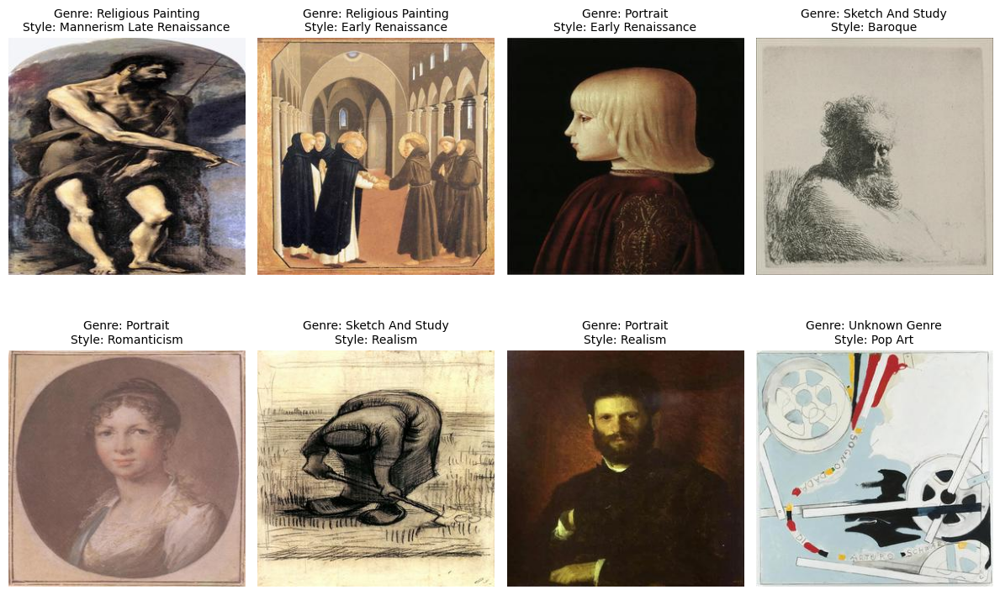

In [34]:
# take a look at the training images
visualize_data(image_path=train_dir,
               annotations=annotations,
               genres=genres, styles=styles)

##Experiment

###Objective

The goal is to train and compare two feature extractors on the images to determine the best-performing model for our task.

*Feature Extractor?*

>A feature extractor is a model used in transfer learning where the base layers are frozen, and the output (or head) layers are customized to address a specific problem. This approach leverages pre-trained models to extract relevant features from the data, reducing training time and improving performance.
<br/><br/>
###Plan

**Baseline Model: EfficientNet-B2 (EffNetB2)**

Choice Rationale:

EfficientNet-B2 is known for its excellent performance and efficiency. It provides a strong starting point due to its balance between accuracy and computational resource requirements.

Approach:

Train the EfficientNet-B2 model with frozen base layers and customized output layers tailored to multi-label classification problem.

<br/>

**Comparison Model: Vision Transformer (ViT)**

Choice Rationale:

Transformers have shown superior performance over traditional Convolutional Neural Networks (CNNs) in various tasks. The Vision Transformer (ViT) represents a modern approach that could potentially yield better results.

Approach:

Train the Vision Transformer with frozen base layers and customized output layers, similar to the baseline model, and compare its performance against EfficientNet-B2.

<br/>


###Data Augmentation:

To enhance the robustness and performance of the models, I will apply additional data augmentation techniques. Augmentation can help improve model generalization by creating variations of the training data, leading to potentially better metrics.

###In General:

* Class weights will be adjusted to give more importance to less frequent classes.
* Epochs: 20
* Loss Function: nn.CrossEntropyLoss()
  * good for selecting between multiple classes
* Optimizer = AdamW
  >Adapts the learning rate for each parameter based on estimates of first and second moments of the gradients. This can lead to more stable and efficient training, particularly beneficial in multi-label classification where different labels might have different characteristics.
* Learning Rate: 0.0004
* Weight Decay (L2 regularization) = 1e-5
  * Helps in preventing overfitting

### Experiment 1 (EffNetB2)

In [15]:
# setup pretrained EffNetB2 weights
effnet_weights = torchvision.models.EfficientNet_B2_Weights.DEFAULT

# get EffNetB2 transforms
effnetb2_transforms = effnet_weights.transforms()

# init pretrained model
effnetb2 = torchvision.models.efficientnet_b2(weights=effnet_weights)

In [16]:
effnetb2_transforms

ImageClassification(
    crop_size=[288]
    resize_size=[288]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BICUBIC
)

In [17]:
from torchinfo import summary

# Print EffNetB2 summary
summary(effnetb2,
        input_size=(1, 3, 288, 288),
        col_names=['input_size','output_size','num_params','trainable'],
        col_width=20,
        row_settings=['var_names'])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [1, 3, 288, 288]     [1, 1000]            --                   True
├─Sequential (features)                                      [1, 3, 288, 288]     [1, 1408, 9, 9]      --                   True
│    └─Conv2dNormActivation (0)                              [1, 3, 288, 288]     [1, 32, 144, 144]    --                   True
│    │    └─Conv2d (0)                                       [1, 3, 288, 288]     [1, 32, 144, 144]    864                  True
│    │    └─BatchNorm2d (1)                                  [1, 32, 144, 144]    [1, 32, 144, 144]    64                   True
│    │    └─SiLU (2)                                         [1, 32, 144, 144]    [1, 32, 144, 144]    --                   --
│    └─Sequential (1)                                        [1, 32, 144, 144]    [1, 16, 144,

There are > 9_000_000 trainable parameters.

**Plan**
* Freeze all the trainable layers except for the classifier output layer.
* Add a Sigmoid layer to the output layer since the problem involves multiple classifications.



In [18]:
effnetb2.classifier

Sequential(
  (0): Dropout(p=0.3, inplace=True)
  (1): Linear(in_features=1408, out_features=1000, bias=True)
)

#### Create Model

In [19]:
import torch
from torch import nn
import torchvision

class EffNetB2Model(nn.Module):
    def __init__(self, num_genres, num_styles):
        super(EffNetB2Model, self).__init__()

        # load pre-trained EfficientNet-B2
        self.pretrained_model = torchvision.models.efficientnet_b2(weights=torchvision.models.EfficientNet_B2_Weights.DEFAULT)

        # freeze all layers in the EfficientNet-B2 backbone
        for param in self.pretrained_model.parameters():
            param.requires_grad = False

        # remove the original classifier
        self.pretrained_model.classifier = nn.Identity()

        # define a global average pooling layer
        self.global_pooling = nn.AdaptiveAvgPool2d(1)

        # define a dropout layer
        self.dropout = nn.Dropout(p=0.3)

        in_features = self.pretrained_model.features[-1].out_channels

        # Define separate heads for genre and style
        self.genre_head = nn.Linear(in_features, num_genres)
        self.style_head = nn.Linear(in_features, num_styles)

    def forward(self, x):
        x = self.pretrained_model.features(x)
        x = self.global_pooling(x)
        x = torch.flatten(x, 1)
        x = self.dropout(x)

        # Pass through genre and style heads
        genre = self.genre_head(x)
        style = self.style_head(x)

        return genre, style


In [133]:
base_effnetb2 = EffNetB2Model(num_genres=len(genres), num_styles=len(styles)).to(device)

summary(base_effnetb2,
        input_size=(1, 3, 288, 288),
        col_names=['input_size','output_size','num_params','trainable'],
        col_width=20,
        row_settings=['var_names'])

Layer (type (var_name))                                           Input Shape          Output Shape         Param #              Trainable
EffNetB2Model (EffNetB2Model)                                     [1, 3, 288, 288]     [1, 11]              --                   Partial
├─EfficientNet (pretrained_model)                                 --                   --                   --                   False
│    └─Sequential (features)                                      [1, 3, 288, 288]     [1, 1408, 9, 9]      --                   False
│    │    └─Conv2dNormActivation (0)                              [1, 3, 288, 288]     [1, 32, 144, 144]    (928)                False
│    │    └─Sequential (1)                                        [1, 32, 144, 144]    [1, 16, 144, 144]    (2,060)              False
│    │    └─Sequential (2)                                        [1, 16, 144, 144]    [1, 24, 72, 72]      (27,424)             False
│    │    └─Sequential (3)                       

**Good to be Frozen:**

Trainable params dropped from 9,109,994 -> 53.542.  Yay! transfer learning.  It's cool right?

#### Create Dataloaders

In [21]:
#%%writefile modules/data_setup.py
"""Contains function for creating dataloaders using annotation files.
"""
import os
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image

class CustomImageDataset(Dataset):
    def __init__(self, annotations_file: str, root_dir: str, num_genres:int, transform=None):
        """
        Initializes the dataset.

        Args:
        annotations_file (str): Path to the CSV file containing image file names and labels.
        root_dir (str): Directory containing all the images.
        transform (callable, optional): Transformations to apply to the images.
        """
        self.annotations = pd.read_csv(annotations_file)
        self.root_dir = root_dir
        self.transform = transform
        self.num_genres = num_genres

    def __len__(self):
        return len(self.annotations)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img_path = os.path.join(self.root_dir, self.annotations.iloc[idx, 0])
        image = Image.open(img_path)

        # get one-hot encoded labels
        genre_labels = self.annotations.iloc[idx, 1:self.num_genres + 1].values.astype(float)
        style_labels = self.annotations.iloc[idx, self.num_genres + 1:].values.astype(float)

        # Convert to PyTorch tensors
        genre_labels = torch.tensor(genre_labels, dtype=torch.float)
        style_labels = torch.tensor(style_labels, dtype=torch.float)

        # Apply transformations if provided
        if self.transform:
            image = self.transform(image)

        return image, genre_labels, style_labels

def data_setup(train_transform,
               test_transform,
               train_annotations:str,
               val_annotations:str,
               test_annotations:str,
               train_images:str,
               val_images:str,
               test_images:str,
               num_workers:int,
               num_genres:int,
               batch_size:int = BATCH_SIZE):

  # create datasets
  train_dataset = CustomImageDataset(annotations_file=train_annotations, root_dir=train_images, num_genres=num_genres, transform=train_transform)
  val_dataset = CustomImageDataset(annotations_file=val_annotations, root_dir=val_images, num_genres=num_genres, transform=test_transform)
  test_dataset = CustomImageDataset(annotations_file=test_annotations, root_dir=test_images, num_genres=num_genres, transform=test_transform)

  # create dataloaders
  train_dataloader = DataLoader(dataset=train_dataset,
                                batch_size=batch_size, # how many samples per batch?
                                num_workers=num_workers, # how many subprocesses to use for data loading? (higher = more)
                                shuffle=True,
                                pin_memory=True) # faster transfer to GPU memory

  val_dataloader = DataLoader(dataset=val_dataset,
                              batch_size=batch_size,
                              num_workers=num_workers,
                              shuffle=False, # no shuffling on val/test
                              pin_memory=True)

  test_dataloader = DataLoader(dataset=test_dataset,
                              batch_size=batch_size,
                              num_workers=num_workers,
                              shuffle=False, # no shuffling on val/test
                              pin_memory=True)

  return train_dataloader, val_dataloader, test_dataloader

In [134]:
# Paths to the annotation files and image directory
train_annotations_path = train_dir / 'train_annotations.csv'
val_annotations_path = val_dir / 'val_annotations.csv'
test_annotations_path = test_dir / 'test_annotations.csv'

train_images_path = train_dir / 'images'
val_images_path = val_dir / 'images'
test_images_path = test_dir / 'images'


NUM_WORKERS = os.cpu_count()

train_dataloader, val_dataloader, test_dataloader= data_setup(train_transform=effnetb2_transforms,
                                                                          test_transform=effnetb2_transforms,
                                                                          train_annotations=train_annotations_path,
                                                                          val_annotations=val_annotations_path,
                                                                          test_annotations=test_annotations_path,
                                                                          train_images=train_images_path,
                                                                          val_images=val_images_path,
                                                                          test_images=test_images_path,
                                                                          num_workers=NUM_WORKERS,
                                                                          num_genres=len(genres),
                                                                          batch_size=BATCH_SIZE)

#### Train Model

In [51]:
import torch
from torch import nn, optim
import numpy as np


def process_step(model: nn.Module,
                 dataloader: torch.utils.data.DataLoader,
                 genre_loss_fn: nn.Module,
                 style_loss_fn: nn.Module,
                 device: torch.device,
                 is_train_step: bool,
                 epoch: int,
                 num_epochs: int,
                 num_genres: int,
                 optimizer: optim.Optimizer = None) -> dict:
    """
    Processes a PyTorch model for a single epoch.

    Args:
    model (nn.Module): A PyTorch model to be processed.
    dataloader (torch.utils.data.DataLoader): A DataLoader instance for the model to be processed on.
    genre_loss_fn (nn.Module): A PyTorch loss function for genres.
    style_loss_fn (nn.Module): A PyTorch loss function for styles.
    device (torch.device): A target device to compute on (e.g., "cuda" or "cpu").
    is_train_step (bool): Indicates if this is a train step else it's a validation step
    epoch (int): The current epoch number, for logging.
    num_epochs (int): The total number of epochs, for logging.
    num_genres (int): Number of unique genres.
    optimizer (optim.Optimizer, Optional): A PyTorch optimizer to help minimize the loss function.

    Returns:
    dict: Contains total loss, genre and style losses, genre and style accuracies, and predictions/labels.
    """

    model.train() if is_train_step else model.eval()

    running_loss, running_genre_loss, running_style_loss = 0.0, 0.0, 0.0
    running_genre_corrects, running_style_corrects = 0.0, 0.0
    num_genre_samples, num_style_samples = 0, 0

    epoch_genre_preds = []
    epoch_style_preds = []

    epoch_genre_labels = []
    epoch_style_labels = []

    # turn on inference context manager if validating
    with torch.inference_mode(is_train_step == False):
        for batch_idx, (image, genre, style) in enumerate(dataloader):
            # send data to device
            image, genre, style = image.to(device), genre.to(device), style.to(device)

            # zero the parameter gradients if training
            if is_train_step and optimizer:
              optimizer.zero_grad()

            # forward pass
            genre_logits, style_logits = model(image)

            # calculate loss
            genre_loss = genre_loss_fn(genre_logits, genre)
            style_loss = style_loss_fn(style_logits, style)
            total_loss = genre_loss + style_loss

            # backward pass and optimization if training
            if is_train_step:
              total_loss.backward()

              if optimizer:
                optimizer.step()

            running_genre_loss += genre_loss.item()
            running_style_loss += style_loss.item()
            running_loss += total_loss.item()

            num_genre_samples += genre.size(0)
            num_style_samples += style.size(0)

            # compute predictions
            genre_preds = torch.argmax(torch.softmax(genre_logits, dim=1), dim=1)
            style_preds = torch.argmax(torch.softmax(style_logits, dim=1), dim=1)

            # convert one-hot encoded labels to class indices
            genre_labels = torch.argmax(genre, dim=1)
            style_labels = torch.argmax(style, dim=1)

            # accumulate correct predictions
            running_genre_corrects += torch.sum(genre_preds == genre_labels).item()
            running_style_corrects += torch.sum(style_preds == style_labels).item()

            # append predictions and labels
            epoch_genre_preds.extend(genre_preds.cpu().numpy())
            epoch_style_preds.extend(style_preds.cpu().numpy())

            epoch_genre_labels.extend(genre_labels.cpu().numpy())
            epoch_style_labels.extend(style_labels.cpu().numpy())

    dataloader_len =  len(dataloader)
    avg_genre_loss = running_genre_loss / dataloader_len
    avg_style_loss = running_style_loss / dataloader_len
    avg_loss = running_loss / dataloader_len

    # convert lists to numpy arrays
    genre_labels_int = np.array(epoch_genre_labels)
    style_labels_int = np.array(epoch_style_labels)

    genre_accuracy = running_genre_corrects / num_genre_samples if num_genre_samples > 0 else 0
    style_accuracy = running_style_corrects / num_style_samples if num_style_samples > 0 else 0
    accuracy_total = (running_genre_corrects + running_style_corrects) / max(num_genre_samples, num_style_samples) if max(num_genre_samples, num_style_samples) > 0 else 0

    return {
        'loss': avg_loss,
        'accuracy': accuracy_total,
        'genre': {
            'loss': avg_genre_loss,
            'accuracy': genre_accuracy,
            'preds': np.array(epoch_genre_preds),
            'labels': genre_labels_int
        },
        'style': {
            'loss': avg_style_loss,
            'accuracy': style_accuracy,
            'preds': np.array(epoch_style_preds),
            'labels': style_labels_int
        }
      }


In [52]:
def train(model: nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          validation_dataloader: torch.utils.data.DataLoader,
          optimizer: optim.Optimizer,
          genre_loss_fn: nn.Module,
          style_loss_fn: nn.Module,
          epochs: int,
          num_genres: int,
          device: torch.device) -> dict[str, list[float]]:

    """Trains and validates a PyTorch model.

    Passes a target PyTorch model through train_step() and validation_step()
    functions for a number of epochs, training and testing the model
    in the same epoch loop.

    Calculates, prints and stores evaluation metrics throughout.

    Args:
      model (nn.Module): A PyTorch model to be trained and tested.
      train_dataloader (torch.utils.data.DataLoader): A DataLoader instance for the model to be trained on.
      validation_dataloader (torch.utils.data.DataLoader): A DataLoader instance for the model to be tested on.
      optimizer (optim.Optimizer): A PyTorch optimizer to help minimize the loss function.
      genre_loss_fn (nn.Module): PyTorch loss function to calculate loss on both datasets.
      style_loss_fn (nn.Module): PyTorch loss function to calculate loss on both datasets.
      epochs (int): An integer indicating how many epochs to train for.
      num_genres (int): Number of unique genres
      device (torch.device): A target device to compute on (e.g., "cuda" or "cpu").

    Returns:
      dict: A dictionary of loss, predictions, ground truth labels, and accuracies by threshold for each step.
    """
    # Create empty results dictionary
    results = {
          "train_avg_loss": [],
          'train_avg_accuracy': [],
          "train_genre_loss":[],
          "train_style_loss": [],
          "train_genre_acc":[],
          "train_style_acc": [],
          "train_genre_preds": [],
          "train_style_preds": [],
          "train_genre_labels": [],
          "train_style_labels": [],
          "val_avg_loss": [],
          'val_avg_accuracy': [],
          "val_genre_loss": [],
          "val_style_loss": [],
          "val_genre_acc": [],
          "val_style_acc": [],
          "val_genre_preds": [],
          "val_style_preds": [],
          "val_genre_labels": [],
          "val_style_labels": [],
      }


    # loop through training and validation steps for a number of epochs
    for epoch in tqdm(range(epochs), total=epochs):
        train_results = process_step(model=model,
                                  dataloader=train_dataloader,
                                  genre_loss_fn=genre_loss_fn,
                                  style_loss_fn=style_loss_fn,
                                  optimizer=optimizer,
                                  device=device,
                                  is_train_step=True,
                                  epoch=epoch+1,
                                  num_genres=num_genres,
                                  num_epochs=epochs)


        val_results = process_step(model=model,
                                     dataloader=validation_dataloader,
                                     genre_loss_fn=genre_loss_fn,
                                     style_loss_fn=style_loss_fn,
                                     device=device,
                                     is_train_step=False,
                                     num_genres=num_genres,
                                     epoch=epoch+1,
                                     num_epochs=epochs)


        print(f"Epoch: {epoch+1}",
            f"Train: Avg Loss: {train_results['loss']:.4f} | Avg Accuracy: {train_results['accuracy']:.4f}\n",
            f"Val: Avg Loss: {val_results['loss']:.4f} | Avg Accuracy: {val_results['accuracy']:.4f}\n",
            sep=" | "
        )

        results["train_avg_loss"].append(train_results['loss'])
        results["train_avg_accuracy"].append(train_results['accuracy'])
        results["train_genre_loss"].append(train_results['genre']['loss'])
        results["train_genre_acc"].append(train_results['genre']['accuracy'])
        results["train_genre_preds"].append(train_results['genre']['preds'])
        results["train_genre_labels"].append(train_results['genre']['labels'])
        results["train_style_loss"].append(train_results['style']['loss'])
        results["train_style_acc"].append(train_results['style']['accuracy'])
        results["train_style_preds"].append(train_results['style']['preds'])
        results["train_style_labels"].append(train_results['style']['labels'])
        results["val_avg_loss"].append(val_results['loss'])
        results["val_avg_accuracy"].append(val_results['accuracy'])
        results["val_genre_loss"].append(val_results['genre']['loss'])
        results["val_genre_acc"].append(val_results['genre']['accuracy'])
        results["val_genre_preds"].append(val_results['genre']['preds'])
        results["val_genre_labels"].append(val_results['genre']['labels'])
        results["val_style_loss"].append(val_results['style']['loss'])
        results["val_style_acc"].append(val_results['style']['accuracy'])
        results["val_style_preds"].append(val_results['style']['preds'])
        results["val_style_labels"].append(val_results['style']['labels'])

    return results


In [53]:
import time
from contextlib import contextmanager

@contextmanager
def track_time():
  start = time.time()
  yield
  end = time.time()
  print(f"Execution time: {end - start:.2f}s")

In [54]:
import numpy as np
from sklearn.utils.class_weight import compute_class_weight

def compute_class_weights(y):
  class_weights = compute_class_weight('balanced', classes=np.unique(y), y=y)
  return dict(enumerate(class_weights))

In [55]:
def get_class_weights(df, for_genre:bool, num_classes:int) -> torch.Tensor:

  col_name = 'genre' if for_genre == True else 'style'

  labels = df[[f'{col_name}_{i}' for i in range(0, num_classes)]].values

  # Convert one-hot encoded genres back to single labels
  labels = labels.argmax(axis=1)
  class_weights = compute_class_weights(labels)

  return torch.tensor([class_weights[i] for i in range(len(class_weights))], dtype=torch.float32).to(device)

In [135]:
from torch.optim.lr_scheduler import ReduceLROnPlateau

genre_class_weights_tensor = get_class_weights(train_annotations, for_genre=True, num_classes=len(genres))
style_class_weights_tensor = get_class_weights(train_annotations, for_genre=False, num_classes=len(styles))

# create loss functions with the balanced weights
genre_loss_fn = nn.CrossEntropyLoss(weight= genre_class_weights_tensor)
style_loss_fn = nn.CrossEntropyLoss(weight= style_class_weights_tensor)

# init optimizer with L2 regularization
optimizer = optim.AdamW(base_effnetb2.parameters(), lr=1e-4, weight_decay=1e-5)

In [136]:
# Training function
set_seeds()

with track_time():
  base_effnetb2_results = train(model=base_effnetb2,
                                train_dataloader=train_dataloader,
                                validation_dataloader=val_dataloader,
                                optimizer=optimizer,
                                genre_loss_fn=genre_loss_fn,
                                style_loss_fn=style_loss_fn,
                                epochs=EPOCHS,
                                num_genres=len(genres),
                                device=device)

  5%|▌         | 1/20 [01:23<26:35, 83.96s/it]

Epoch: 1 | Train: Avg Loss: 4.6794 | Avg Accuracy: 0.6644
 | Val: Avg Loss: 4.0478 | Avg Accuracy: 0.8330



 10%|█         | 2/20 [02:48<25:16, 84.23s/it]

Epoch: 2 | Train: Avg Loss: 3.7794 | Avg Accuracy: 0.8188
 | Val: Avg Loss: 3.5685 | Avg Accuracy: 0.8697



 15%|█▌        | 3/20 [04:12<23:49, 84.11s/it]

Epoch: 3 | Train: Avg Loss: 3.4411 | Avg Accuracy: 0.8519
 | Val: Avg Loss: 3.3376 | Avg Accuracy: 0.8852



 20%|██        | 4/20 [05:36<22:24, 84.02s/it]

Epoch: 4 | Train: Avg Loss: 3.2635 | Avg Accuracy: 0.8678
 | Val: Avg Loss: 3.1920 | Avg Accuracy: 0.8870



 25%|██▌       | 5/20 [07:00<21:03, 84.20s/it]

Epoch: 5 | Train: Avg Loss: 3.1483 | Avg Accuracy: 0.8771
 | Val: Avg Loss: 3.1062 | Avg Accuracy: 0.9124



 30%|███       | 6/20 [08:25<19:43, 84.54s/it]

Epoch: 6 | Train: Avg Loss: 3.0683 | Avg Accuracy: 0.8828
 | Val: Avg Loss: 3.0425 | Avg Accuracy: 0.9064



 35%|███▌      | 7/20 [09:50<18:17, 84.41s/it]

Epoch: 7 | Train: Avg Loss: 3.0084 | Avg Accuracy: 0.8936
 | Val: Avg Loss: 3.0094 | Avg Accuracy: 0.9235



 40%|████      | 8/20 [11:13<16:50, 84.17s/it]

Epoch: 8 | Train: Avg Loss: 2.9609 | Avg Accuracy: 0.9023
 | Val: Avg Loss: 2.9635 | Avg Accuracy: 0.9123



 45%|████▌     | 9/20 [12:37<15:25, 84.11s/it]

Epoch: 9 | Train: Avg Loss: 2.9192 | Avg Accuracy: 0.9041
 | Val: Avg Loss: 2.9373 | Avg Accuracy: 0.9206



 50%|█████     | 10/20 [14:02<14:02, 84.24s/it]

Epoch: 10 | Train: Avg Loss: 2.8850 | Avg Accuracy: 0.9084
 | Val: Avg Loss: 2.9064 | Avg Accuracy: 0.9226



 55%|█████▌    | 11/20 [15:26<12:39, 84.37s/it]

Epoch: 11 | Train: Avg Loss: 2.8660 | Avg Accuracy: 0.9128
 | Val: Avg Loss: 2.8834 | Avg Accuracy: 0.9335



 60%|██████    | 12/20 [16:50<11:13, 84.23s/it]

Epoch: 12 | Train: Avg Loss: 2.8445 | Avg Accuracy: 0.9114
 | Val: Avg Loss: 2.8677 | Avg Accuracy: 0.9144



 65%|██████▌   | 13/20 [18:15<09:50, 84.36s/it]

Epoch: 13 | Train: Avg Loss: 2.8153 | Avg Accuracy: 0.9181
 | Val: Avg Loss: 2.8471 | Avg Accuracy: 0.9419



 70%|███████   | 14/20 [19:40<08:26, 84.44s/it]

Epoch: 14 | Train: Avg Loss: 2.7954 | Avg Accuracy: 0.9205
 | Val: Avg Loss: 2.8462 | Avg Accuracy: 0.9282



 75%|███████▌  | 15/20 [21:05<07:02, 84.59s/it]

Epoch: 15 | Train: Avg Loss: 2.7774 | Avg Accuracy: 0.9212
 | Val: Avg Loss: 2.8268 | Avg Accuracy: 0.9467



 80%|████████  | 16/20 [22:30<05:38, 84.75s/it]

Epoch: 16 | Train: Avg Loss: 2.7756 | Avg Accuracy: 0.9246
 | Val: Avg Loss: 2.8315 | Avg Accuracy: 0.9326



 85%|████████▌ | 17/20 [23:55<04:14, 85.00s/it]

Epoch: 17 | Train: Avg Loss: 2.7483 | Avg Accuracy: 0.9279
 | Val: Avg Loss: 2.8113 | Avg Accuracy: 0.9392



 90%|█████████ | 18/20 [25:20<02:50, 85.07s/it]

Epoch: 18 | Train: Avg Loss: 2.7501 | Avg Accuracy: 0.9265
 | Val: Avg Loss: 2.8065 | Avg Accuracy: 0.9368



 95%|█████████▌| 19/20 [26:46<01:25, 85.07s/it]

Epoch: 19 | Train: Avg Loss: 2.7438 | Avg Accuracy: 0.9259
 | Val: Avg Loss: 2.8025 | Avg Accuracy: 0.9286



100%|██████████| 20/20 [28:10<00:00, 84.53s/it]

Epoch: 20 | Train: Avg Loss: 2.7186 | Avg Accuracy: 0.9278
 | Val: Avg Loss: 2.7921 | Avg Accuracy: 0.9442

Execution time: 1690.61s


<h3>My First Thoughts:</h3>
The total loss combines several components, so it is naturally higher than the loss values for each individual label. The observed decrease in total loss suggests that the model is converging effectively. The average accuracy is also promising. I will further investigate to determine whether this improvement is contributed by both labels or primarily by one of them.

####Model Performance Evaluation
In this section, I will evaluate model performance. I will plotting the following..

* Loss curve for combination of artist, genre, and style losses:  If the trend is descending, which it is, then it's converging.
* Genre and style accuracies: The proportion of correctly predicted labels to the total number of labels for each instance. The higher the score, the better the model's performance.
* Average F1 Score for each label
* Average Recall Score for each label
* Average Precision Score for each label
* Finally, predictions will be made on the test data, and the results will be displayed.



<h3>Base Effnetb2 Evaluation</h3>


In [137]:
# taking a look at the results
base_effnetb2_results_df = pd.DataFrame(base_effnetb2_results)
base_effnetb2_results_df.head()

,train_avg_loss,train_avg_accuracy,train_genre_loss,train_style_loss,train_genre_acc,train_style_acc,train_genre_preds,train_style_preds,train_genre_labels,train_style_labels,val_avg_loss,val_avg_accuracy,val_genre_loss,val_style_loss,val_genre_acc,val_style_acc,val_genre_preds,val_style_preds,val_genre_labels,val_style_labels
0,4.679361,0.664442,1.822616,2.856745,0.432086,0.232356,"[7, 6, 4, 2, 7, 2, 9, 1, 1, 1, 1, 1, 1, 3, 7, ...","[12, 8, 6, 1, 4, 7, 17, 10, 6, 21, 1, 10, 0, 8...","[10, 2, 7, 10, 10, 1, 10, 2, 7, 4, 6, 2, 9, 2,...","[4, 20, 4, 13, 24, 3, 3, 9, 24, 23, 12, 7, 21,...",4.047759,0.832982,1.519773,2.527985,0.505315,0.327666,"[0, 6, 0, 7, 1, 4, 1, 6, 4, 2, 4, 7, 8, 1, 7, ...","[5, 22, 15, 13, 20, 24, 12, 12, 15, 18, 12, 13...","[4, 6, 10, 10, 1, 4, 1, 6, 4, 10, 4, 7, 8, 4, ...","[24, 12, 3, 4, 3, 24, 12, 12, 15, 24, 12, 13, ..."
1,3.779424,0.818774,1.433545,2.345879,0.498240,0.320534,"[4, 9, 6, 2, 1, 10, 1, 7, 6, 6, 7, 0, 7, 5, 1,...","[21, 24, 19, 21, 12, 10, 12, 13, 22, 23, 11, 7...","[4, 7, 6, 4, 1, 2, 2, 10, 6, 6, 7, 6, 7, 10, 2...","[21, 24, 6, 21, 22, 9, 12, 4, 12, 17, 13, 7, 1...",3.568452,0.869670,1.346680,2.221772,0.523276,0.346394,"[4, 6, 0, 7, 1, 4, 1, 6, 4, 2, 4, 7, 8, 1, 7, ...","[5, 22, 25, 13, 20, 24, 12, 22, 15, 18, 12, 24...","[4, 6, 10, 10, 1, 4, 1, 6, 4, 10, 4, 7, 8, 4, ...","[24, 12, 3, 4, 3, 24, 12, 12, 15, 24, 12, 13, ..."
2,3.441091,0.851871,1.330612,2.110479,0.513038,0.338832,"[2, 4, 4, 5, 0, 6, 9, 0, 8, 1, 4, 4, 4, 3, 6, ...","[12, 24, 12, 9, 19, 22, 12, 1, 9, 24, 12, 23, ...","[2, 10, 4, 7, 10, 7, 1, 0, 8, 2, 4, 4, 2, 7, 6...","[12, 23, 20, 15, 19, 17, 12, 1, 11, 9, 21, 23,...",3.337601,0.885213,1.275863,2.061738,0.528073,0.357140,"[4, 6, 0, 7, 1, 4, 1, 6, 4, 2, 4, 7, 8, 1, 7, ...","[24, 22, 25, 13, 20, 24, 12, 22, 15, 18, 12, 1...","[4, 6, 10, 10, 1, 4, 1, 6, 4, 10, 4, 7, 8, 4, ...","[24, 12, 3, 4, 3, 24, 12, 12, 15, 24, 12, 13, ..."
3,3.263506,0.867795,1.287147,1.976359,0.521164,0.346631,"[9, 0, 8, 8, 3, 4, 7, 1, 4, 3, 9, 3, 7, 0, 6, ...","[15, 25, 23, 9, 19, 21, 22, 21, 12, 1, 12, 17,...","[10, 10, 2, 2, 10, 4, 2, 4, 1, 0, 4, 7, 7, 10,...","[9, 7, 21, 9, 3, 21, 22, 23, 9, 1, 12, 17, 8, ...",3.191989,0.887017,1.240413,1.951575,0.529186,0.357831,"[4, 6, 0, 7, 1, 4, 1, 6, 4, 2, 4, 7, 8, 1, 7, ...","[5, 22, 25, 13, 20, 24, 12, 22, 15, 18, 12, 13...","[4, 6, 10, 10, 1, 4, 1, 6, 4, 10, 4, 7, 8, 4, ...","[24, 12, 3, 4, 3, 24, 12, 12, 15, 24, 12, 13, ..."
4,3.148347,0.877149,1.258310,1.890037,0.523272,0.353877,"[4, 5, 4, 6, 4, 5, 2, 6, 7, 4, 0, 5, 2, 8, 10,...","[24, 10, 12, 22, 23, 6, 26, 22, 8, 12, 3, 15, ...","[4, 6, 4, 10, 4, 5, 10, 6, 2, 4, 2, 9, 6, 2, 6...","[12, 12, 23, 21, 23, 6, 12, 9, 24, 12, 9, 23, ...",3.106226,0.912384,1.218562,1.887664,0.538819,0.373566,"[4, 6, 0, 7, 1, 4, 1, 6, 4, 2, 4, 7, 8, 1, 7, ...","[24, 22, 25, 13, 20, 24, 20, 22, 15, 18, 12, 2...","[4, 6, 10, 10, 1, 4, 1, 6, 4, 10, 4, 7, 8, 4, ...","[24, 12, 3, 4, 3, 24, 12, 12, 15, 24, 12, 13, ..."


<h3>Loss and Accuracy Plots for Training and Validation</h3>

This plot visualizes the training and validation loss and accuracy values per epoch. It helps in understanding whether the model is learning effectively and in identifying any signs of overfitting or underfitting.

In [138]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_loss_and_accuracy_curves(results: pd.DataFrame, model_name: str):
    epochs = range(len(results))

    plt.figure(figsize=(9, 4))

    # Plot Loss Curve
    plt.subplot(1, 2, 1)
    plt.title(f"{model_name} Model - Loss")
    plt.plot(epochs, results["train_avg_loss"], label="Train Loss", color='r')
    plt.plot(epochs, results["val_avg_loss"], label="Validation Loss", color='b')
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True)

    # Plot Accuracy Curve
    plt.subplot(1, 2, 2)
    plt.title(f"{model_name} Model - Accuracy")
    plt.plot(epochs, results["train_avg_accuracy"], label="Train Accuracy", color='g')
    plt.plot(epochs, results["val_avg_accuracy"], label="Validation Accuracy", color='orange')
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

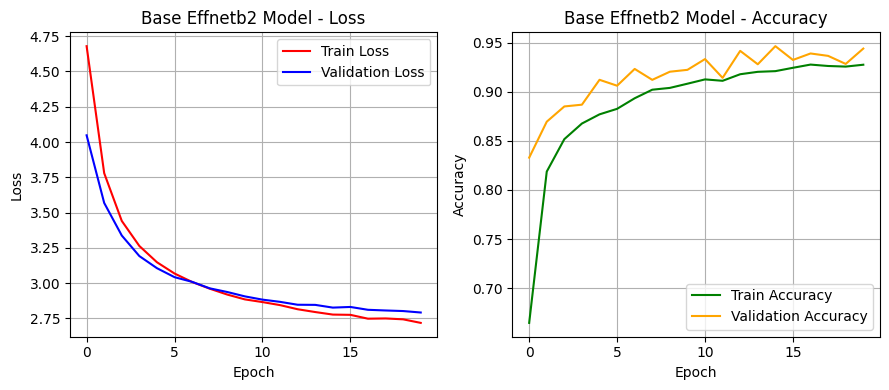

In [139]:
plot_loss_and_accuracy_curves(base_effnetb2_results_df, model_name="Base Effnetb2")

**Loss**: The decreasing loss indicates that the model is progressing towards convergence. To gain a comprehensive understanding of its performance, I will review additional metrics to better assess what the model has learned. It appears that the model may start to overfit around epoch 7.

**Accuracy**: The accuracy is high and shows an upward trend. The fact that validation accuracy exceeds training accuracy suggests that the model is generalizing well.



<h3>Loss and Accuracy Plots for Genre and Style</h3>

In [140]:
def plot_loss_and_accuracy_curves_for_labels(results: pd.DataFrame, model_name: str):
    epochs = range(len(results))

    plt.figure(figsize=(9, 4))

    # Plot Loss Curve
    plt.subplot(2, 2, 1)
    plt.title(f"{model_name} Model - Genre Loss")
    plt.plot(epochs, results["train_genre_loss"], label="Train Loss", color='r')
    plt.plot(epochs, results["val_genre_loss"], label="Validation Loss", color='b')
    plt.xlabel("Epoch")
    plt.ylabel("Genre Loss")
    plt.legend()
    plt.grid(True)

    # Plot Accuracy Curve
    plt.subplot(2, 2, 2)
    plt.title(f"{model_name} Model - Genre Accuracy")
    plt.plot(epochs, results["train_genre_acc"], label="Train Accuracy", color='g')
    plt.plot(epochs, results["val_genre_acc"], label="Validation Accuracy", color='orange')
    plt.xlabel("Epoch")
    plt.ylabel("Genre Accuracy")
    plt.legend()
    plt.grid(True)

    # Plot Loss Curve
    plt.subplot(2, 2, 3)
    plt.title(f"{model_name} Model - Style Loss")
    plt.plot(epochs, results["train_style_loss"], label="Train Loss", color='r')
    plt.plot(epochs, results["val_style_loss"], label="Validation Loss", color='b')
    plt.xlabel("Epoch")
    plt.ylabel("Style Loss")
    plt.legend()
    plt.grid(True)

    # Plot Accuracy Curve
    plt.subplot(2, 2, 4)
    plt.title(f"{model_name} Model - Style Accuracy")
    plt.plot(epochs, results["train_style_acc"], label="Train Accuracy", color='g')
    plt.plot(epochs, results["val_style_acc"], label="Validation Accuracy", color='orange')
    plt.xlabel("Epoch")
    plt.ylabel("Style Accuracy")
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

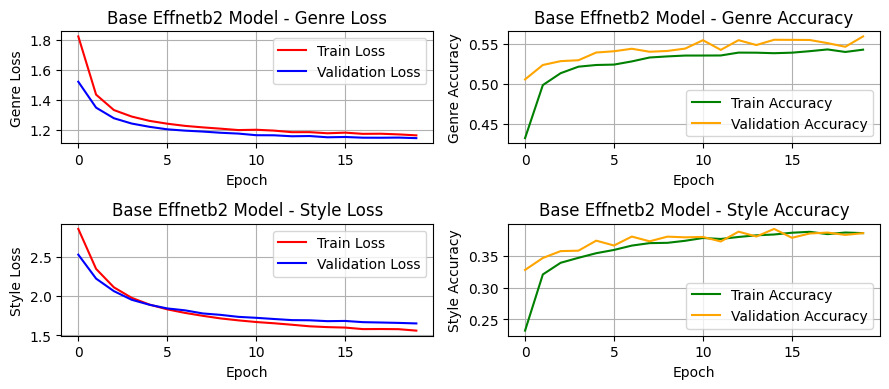

In [141]:
plot_loss_and_accuracy_curves_for_labels(base_effnetb2_results_df, model_name="Base Effnetb2")

By looking at the scale you can see that the model is performing better with the Genre label than with the style label.

In [142]:
from sklearn.metrics import precision_score, recall_score, f1_score
from enum import Enum, auto


# Enum for the metric types
class Metric(Enum):
    PRECISION = 'precision'
    RECALL = 'recall'
    F1 = 'f1'

def get_metrics(results: pd.DataFrame, metric: Metric) -> dict:
    """
    Compute various metrics for training and validation data across multiple epochs.

    Args:
    - results (pd.DataFrame): DataFrame containing 'train_predictions', 'validation_predictions',
                              'train_labels', and 'validation_labels' for each epoch.
    - metric (Metric): The metric type to compute (e.g., precision, recall, f1).

    Returns:
    - dict: Dictionary with computed metrics including accuracy scores, precision, recall, and f1 scores
            for each epoch.
    """
    # Initialize lists to store metrics for each epoch
    epoch_list = []
    train_genre_metrics = []
    train_style_metrics = []

    val_genre_metrics = []
    val_style_metrics = []

    # Extract predictions and labels from results DataFrame
    train_genre_predictions = results['train_genre_preds']
    train_style_predictions = results['train_style_preds']

    val_genre_predictions = results['val_genre_preds']
    val_style_predictions = results['val_style_preds']

    train_genre_labels = results['train_genre_labels']
    train_style_labels = results['train_style_labels']

    val_genre_labels = results['val_genre_labels']
    val_style_labels = results['val_style_labels']

    epochs = range(len(results))

    for epoch in epochs:
      epoch_list.append(epoch)
      match metric:
        case Metric.PRECISION:
          t_genre_metric = precision_score(train_genre_labels[epoch], train_genre_predictions[epoch],
                                           average='macro', zero_division=0)
          t_style_metric = precision_score(train_style_labels[epoch], train_style_predictions[epoch],
                                           average='macro', zero_division=0)

          v_genre_metric = precision_score(val_genre_labels[epoch], val_genre_predictions[epoch],
                                           average='macro', zero_division=0)
          v_style_metric = precision_score(val_style_labels[epoch], val_style_predictions[epoch],
                                           average='macro', zero_division=0)
        case Metric.RECALL:
          t_genre_metric = recall_score(train_genre_labels[epoch], train_genre_predictions[epoch], average='macro')
          t_style_metric = recall_score(train_style_labels[epoch], train_style_predictions[epoch], average='macro')

          v_genre_metric = recall_score(val_genre_labels[epoch], val_genre_predictions[epoch], average='macro')
          v_style_metric = recall_score(val_style_labels[epoch], val_style_predictions[epoch], average='macro')
        case Metric.F1:
          t_genre_metric = f1_score(train_genre_labels[epoch], train_genre_predictions[epoch], average='macro')
          t_style_metric = f1_score(train_style_labels[epoch], train_style_predictions[epoch], average='macro')

          v_genre_metric = f1_score(val_genre_labels[epoch], val_genre_predictions[epoch], average='macro')
          v_style_metric = f1_score(val_style_labels[epoch], val_style_predictions[epoch], average='macro')

      # append calculated metrics
      train_genre_metrics.append(t_genre_metric)
      train_style_metrics.append(t_style_metric)

      val_genre_metrics.append(v_genre_metric)
      val_style_metrics.append(v_style_metric)

    # Return a dictionary containing all computed metrics
    return {
        'epoch': epoch_list,
        'train_genre_metrics': train_genre_metrics,
        'train_style_metrics': train_style_metrics,
        'val_genre_metrics': val_genre_metrics,
        'val_style_metrics': val_style_metrics
    }


In [143]:

def plot_metrics(results: pd.DataFrame, model_name: str, metric:Metric) -> None:

    metric_name = metric.value.capitalize()

    fig, ax = plt.subplots(1, 2, figsize=(9, 4), sharex=True, sharey=True)
    fig.suptitle(f"{model_name} Model - {metric_name}")

    # Flatten the axes array for easier indexing
    ax = ax.flatten()

    # Define colors for the plots
    color_train = 'blue'
    color_val = 'orange'

    # Plot genre metric
    data_genre = results[['epoch', 'train_genre_metrics', 'val_genre_metrics']]
    ax[0].plot(data_genre['epoch'], data_genre['train_genre_metrics'], label="Train", color=color_train)
    ax[0].plot(data_genre['epoch'], data_genre['val_genre_metrics'], label="Validation", color=color_val)
    ax[0].set_title(f"Genre {metric_name}")
    ax[0].set_xlabel("Epochs")
    ax[0].set_ylabel(metric_name)
    ax[0].grid(True)

    # Plot style metric
    data_style = results[['epoch', 'train_style_metrics', 'val_style_metrics']]
    ax[1].plot(data_style['epoch'], data_style['train_style_metrics'], label="Train", color=color_train)
    ax[1].plot(data_style['epoch'], data_style['val_style_metrics'], label="Validation", color=color_val)
    ax[1].set_title(f"Style {metric_name}")
    ax[1].set_xlabel("Epochs")
    ax[1].set_ylabel(metric_name)
    ax[1].grid(True)

    # Add a single legend for the entire figure
    handles, labels = ax[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right', ncol=2)

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

<h3>Plot F1 Score for Training and Validation</h3>

How is the model doing on average between "harmonic mean" between Precision and Recall?

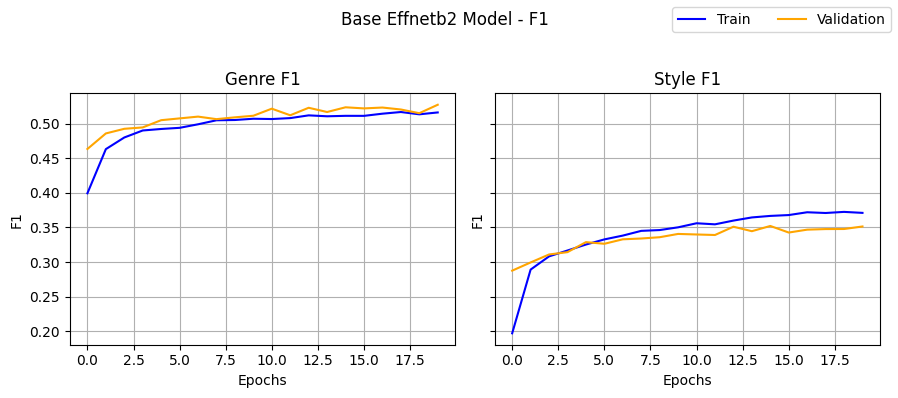

In [144]:
# getting f1 score
base_effnetb2_f1_scores = pd.DataFrame(get_metrics(results=base_effnetb2_results_df, metric=Metric.F1))

# plot results
plot_metrics(results=base_effnetb2_f1_scores,
                             model_name="Base Effnetb2",
                             metric=Metric.F1)

As anticipated from the accuracy metrics, the model performs better at predicting genres compared to styles. This discrepancy may be due to the inherent ambiguity in style classification, which could contribute to the model's reduced performance in this area.

<h3>Plot Precision Score per Threashold for Training and Validation</h3>

Out of all the positive predictions, how many of them were correct?

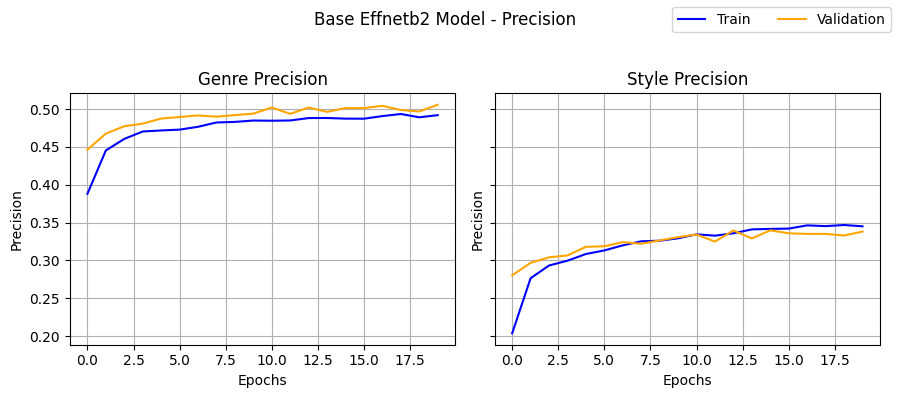

In [145]:
# getting precision score
base_effnetb2_precision_scores = pd.DataFrame(get_metrics(results=base_effnetb2_results_df, metric=Metric.PRECISION))

# plot results
plot_metrics(results=base_effnetb2_precision_scores,
                             model_name="Base Effnetb2",
                             metric=Metric.PRECISION)

On average, when the model predicts a specific style **~35%** of of the time, it is correct for that style. For genre it's a little above **~50%** of the time.

<h3>Plot Recall Score per Threashold for Training and Validation</h3>

Out of all the positive cases available, how many did the model find?

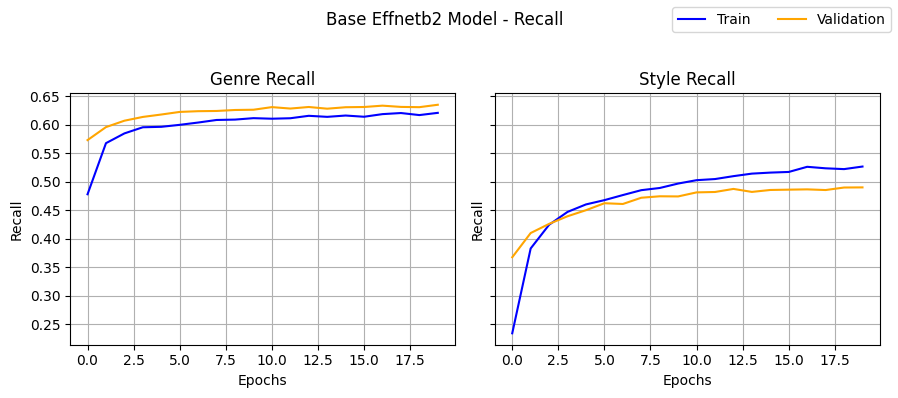

In [146]:
# getting recall score
base_effnetb2_recall_scores = pd.DataFrame(get_metrics(results=base_effnetb2_results_df, metric=Metric.RECALL))

# plot results
plot_metrics(results=base_effnetb2_recall_scores,
                             model_name="Base Effnetb2",
                             metric=Metric.RECALL)

The model is able to predict ~55% of all the style and ~63% of all the genre labels.

<h3>Predicting on Unseen Data</h3>

Next, I'll make predictions on a selection of random images from the test data. I must admit, visualizing how accurately these predictions match the ground truth is the most exciting part of the process.

In [148]:
full_annotations.head()

,artist,genre,style,image_name,artist_name,genre_name,style_name
0,22,4,21,image_0.jpg,Vincent Van Gogh,Landscape,Realism
1,20,7,4,image_1.jpg,Rembrandt,Religious Painting,Baroque
2,16,6,20,image_2.jpg,Paul Cezanne,Portrait,Post Impressionism
3,17,2,12,image_3.jpg,Pierre Auguste Renoir,Genre Painting,Impressionism
4,9,10,23,image_4.jpg,Ivan Aivazovsky,Unknown Genre,Romanticism


In [171]:

def get_decoded_labels(genre_label: np.ndarray, style_label: np.ndarray) -> tuple:
    """
    Decode the predicted labels into their respective agenre, and style.

    Parameters:
    - genre_label (np.ndarray): The predicted genre labels as probabilities.
    - style_label (np.ndarray): The predicted style labels as probabilities.

    Returns:
    - tuple: Decoded genre and style.
    """
    UNKNOWN_VALUE = '<not found>'

    # Map decoded labels to their respective categories or return UNKNOWN_VALUE
    genre = genres[genre_label[0]] if genre_label[0] else UNKNOWN_VALUE
    style = styles[style_label[0]] if style_label[0] else UNKNOWN_VALUE

    return genre, style

In [150]:
def preprocess_image(image_path: str, transform=None) -> torch.Tensor:
    """
    Load and preprocess an image.

    Parameters:
    - image_path (str): Path to the image file.
    - transform (callable, optional): A transform to apply to the image.

    Returns:
    - torch.Tensor: The preprocessed image.
    """
    # Load the image
    image = torchvision.io.read_image(image_path).float()

    # Normalize pixel values to [0, 1]
    image /= 255.0

    # Apply additional transformations if provided
    if transform:
        image = transform(image)

    return image


In [220]:
import random

def pred_and_plot_images(model:torch.nn.Module, image_paths:list[str], annotations_df,
                         transform=None, threshold:float=BEST_THRESHOLD) -> None:
  """
  Makes a prediction on a target image with a trained model and plots the image.

  Args:
    model (torch.nn.Module): trained PyTorch image classification model.
    image_path (str): filepath to target image.
    annotations_df: dataframe that contain the annotations
    transform (_type_, optional): transform of target image. Defaults to None.
    threshold (int, optional): the threshold
  """

  UNKNOWN_VALUE = '<not found>'

  # define the number of artworks to display and the grid layout
  art_count = len(image_paths)
  cols = 4
  rows = art_count // cols
  num_genres = len(genres)

  # set up the plot
  plt.figure(figsize=(12, 4 * rows))

  # make sure the model is on the target device
  model.to(device)

  # turn on model evaluation mode
  model.eval()

  for i in range(rows * cols):
    # pre-process image
    target_image = preprocess_image(image_paths[i], transform)

    with torch.inference_mode():
      # add an extra dimension to the image
      target_image = target_image.unsqueeze(dim=0).to(device)

      # make a prediction
      genre_logits, style_logits = model(target_image.to(device))


    # convert output logits to pred probs
    genre_pred_probs = torch.softmax(genre_logits, dim=1)
    style_pred_probs = torch.softmax(style_logits, dim=1)

    genre_pred_labels = torch.argmax(genre_pred_probs, dim=1).to('cpu')
    style_pred_labels = torch.argmax(style_pred_probs, dim=1).to('cpu')

    pred_genre, pred_style = get_decoded_labels(np.array(genre_pred_labels), np.array(style_pred_labels))


    # get the corresponding true labels
    true_labels = annotations_df[annotations_df['image_name'] == image_paths[i].name]

    num_genres = len(genres)

    genre_labels = torch.tensor(true_labels.iloc[:, 1:num_genres + 1].values)
    style_labels = torch.tensor(true_labels.iloc[:, num_genres + 1:].values)

    genre_label = torch.argmax(genre_labels, dim=1).to('cpu')
    style_label = torch.argmax(style_labels, dim=1).to('cpu')

    true_genre, true_style = get_decoded_labels(np.array(genre_label), np.array(style_label))

    pred_color = 'b' if pred_genre == true_genre and pred_style == true_style else 'r'

    genre_text = f'** Genre: {pred_genre}' if pred_genre != true_genre else f'Genre: {pred_genre}'
    style_text = f'** Style: {pred_style}' if pred_style != true_style else f'Style: {pred_style}'

    # plot the image
    ax = plt.subplot(rows, cols, i + 1)

    plt.imshow(Image.open(image_paths[i]))
    plt.title(f"{genre_text} | {genre_pred_probs.max():.2%}\n{style_text} | {style_pred_probs.max():.2%}",
              fontsize=10, c=pred_color)

    plt.axis('off')

  # show the plot
  plt.tight_layout()
  plt.show()

In [245]:
def predict_random_test_images(
    model: torch.nn.Module,
    test_dir: Path,
    annotations_df,
    transform = None,
    img_count: int = 8
) -> None:
    """
    Predict and plot random test images using the provided model.

    Parameters:
    - model (torch.nn.Module): The trained model to make predictions.
    - test_dir (Path): Directory containing test images.
    - annotations_df: dataframe that contain the annotations
    - transform (Callable, optional): A transform to apply to the images.
    - img_count (int, optional): Number of random images to select. Default is 8.

    Returns:
    - None
    """
    # Get all image paths from the test directory
    img_path_list = list(test_dir.glob('*.jpg'))

    # Sample random images
    selected_images = random.sample(img_path_list, k=img_count)

    # Predict and plot the selected images
    pred_and_plot_images(model=model, image_paths=selected_images, annotations_df=annotations_df, transform=transform)

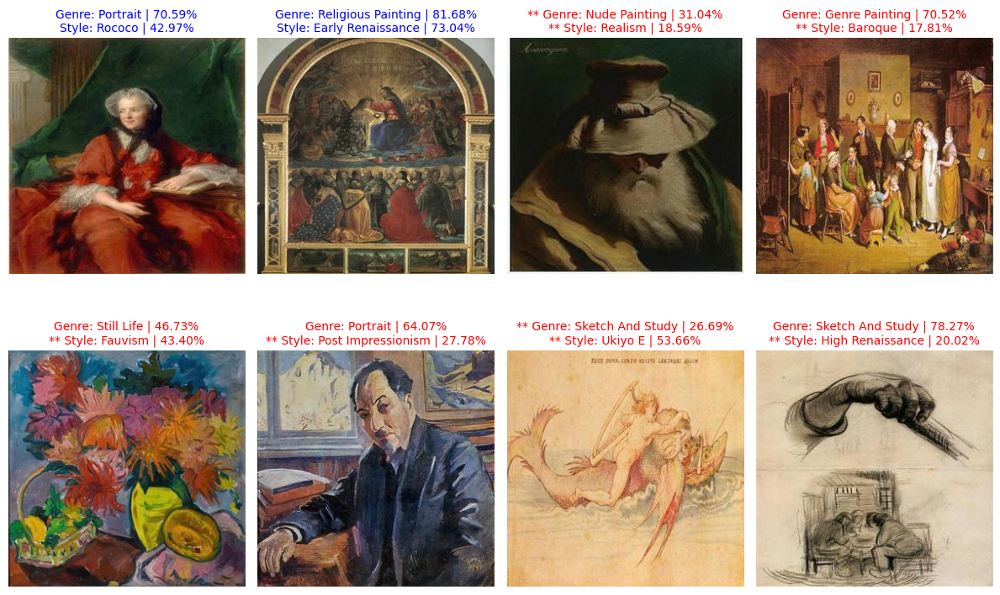

In [223]:
test_images = test_dir / 'images'

predict_random_test_images(model=base_effnetb2,
                           test_dir=test_images,
                           annotations_df=test_annotations,
                           transform=effnetb2_transforms)

The ** indicates that the model got that portion of the labels incorrect.

2 out of 8 for the base model is ok.  The model is clearly able to predict the genre 6 out of the 8 times. It's struggling with the style label.  Maybe adding augmentation to the images will help.

<h3>Collect Test Metrics</h3>

Feeding the model unseen data and collecting the loss, accuracy, f1 score, precision score, and recall score.  This will assist comparing the model to the others and deciding which is the best performing model.

In [229]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def get_test_metrics(genre_preds, style_preds, genre_lbls, style_lbls):

    metrics = {
        'genre_accuracy': accuracy_score(genre_lbls, genre_preds),
        'style_accuracy': accuracy_score(style_lbls, style_preds),
        'genre_precision': precision_score(genre_lbls, genre_preds, zero_division=0, average='macro'),
        'style_precision': precision_score(style_lbls, style_preds, zero_division=0, average='macro'),
        'genre_recall': recall_score(genre_lbls, genre_preds, average='macro'),
        'style_recall': recall_score(style_lbls, style_preds, average='macro'),
        'genre_f1': f1_score(genre_lbls, genre_preds, average='macro'),
        'style_f1': f1_score(style_lbls, style_preds, average='macro')
    }

    return metrics

def evaluate_model(model: nn.Module,
                    model_name: str,
                    dataloader: torch.utils.data.DataLoader,
                    device: torch.device,
                    num_genres: int) -> pd.DataFrame:
    """
    Calculates metrics with the model predictions on test data.

    Args:
    model (nn.Module): A PyTorch model to be tested.
    dataloader (torch.utils.data.DataLoader): A DataLoader instance for the model to be tested on.
    device (torch.device): A target device to compute on (e.g., "cuda" or "cpu").
    num_genres (int): Number of unique genres.

    Returns:
    dict: Metrics including loss, accuracy, precision, recall, and F1 score.
    """
    model.eval()
    loss = 0.0
    total_items = len(dataloader)
    genre_preds_bkt = []
    style_preds_bkt = []
    genre_lbls_bkt = []
    style_lbls_bkt = []

    with torch.inference_mode():
        for images, genres, styles in tqdm(dataloader, total=total_items, desc='Testing...'):
            images, genres, styles = images.to(device), genres.to(device), styles.to(device)

            genre_logits, style_logits = model(images)

            # compute predictions
            genre_preds = torch.argmax(torch.softmax(genre_logits, dim=1), dim=1)
            style_preds = torch.argmax(torch.softmax(style_logits, dim=1), dim=1)

            # convert one-hot encoded labels to class indices
            genre_labels = torch.argmax(genres, dim=1)
            style_labels = torch.argmax(styles, dim=1)

            # append predictions and labels
            genre_preds_bkt.extend(genre_preds.cpu().numpy())
            style_preds_bkt.extend(style_preds.cpu().numpy())

            genre_lbls_bkt.extend(genre_labels.cpu().numpy())
            style_lbls_bkt.extend(style_labels.cpu().numpy())


    dataloader_len =  len(dataloader)

    # convert lists to numpy arrays
    genre_preds_bkt = np.array(genre_preds_bkt)
    style_preds_bkt = np.array(style_preds_bkt)

    genre_lbls_bkt = np.array(genre_lbls_bkt)
    style_lbls_bkt = np.array(style_lbls_bkt)

    metrics = get_test_metrics(genre_preds_bkt, style_preds_bkt, genre_lbls_bkt, style_lbls_bkt)
    metrics['model_name'] = model_name

    return metrics


In [249]:
metrics = evaluate_model(model=base_effnetb2,
                    model_name = 'base_effnetb2',
                    dataloader = test_dataloader,
                    device = device,
                    num_genres = len(genres))


df_metrics = pd.DataFrame([metrics])
df_metrics.head()

Testing...: 100%|██████████| 204/204 [00:10<00:00, 19.15it/s]


,genre_accuracy,style_accuracy,genre_precision,style_precision,genre_recall,style_recall,genre_f1,style_f1,model_name
0,0.565157,0.387567,0.511124,0.336294,0.643357,0.488628,0.533271,0.35278,base_effnetb2


### Experiment 2 (Augmented EffNetB2)

#### Create Model

In [231]:
aug_effnetb2 = EffNetB2Model(num_genres=len(genres), num_styles=len(styles)).to(device)

In [232]:
from torchvision import transforms

# create transforms
aug_effnetb2_transforms = torchvision.transforms.Compose([transforms.RandomHorizontalFlip(),
                                                          transforms.RandomRotation(20),
                                                          transforms.RandomVerticalFlip(),
                                                          effnetb2_transforms])
aug_effnetb2_transforms

Compose(
    RandomHorizontalFlip(p=0.5)
    RandomRotation(degrees=[-20.0, 20.0], interpolation=nearest, expand=False, fill=0)
    RandomVerticalFlip(p=0.5)
    ImageClassification(
    crop_size=[288]
    resize_size=[288]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BICUBIC
)
)

In [233]:
# just to be sure everything is what I expect
summary(aug_effnetb2,
        input_size=(1, 3, 288, 288),
        col_names=['input_size','output_size','num_params','trainable'],
        col_width=20,
        row_settings=['var_names'])

Layer (type (var_name))                                           Input Shape          Output Shape         Param #              Trainable
EffNetB2Model (EffNetB2Model)                                     [1, 3, 288, 288]     [1, 11]              --                   Partial
├─EfficientNet (pretrained_model)                                 --                   --                   --                   False
│    └─Sequential (features)                                      [1, 3, 288, 288]     [1, 1408, 9, 9]      --                   False
│    │    └─Conv2dNormActivation (0)                              [1, 3, 288, 288]     [1, 32, 144, 144]    (928)                False
│    │    └─Sequential (1)                                        [1, 32, 144, 144]    [1, 16, 144, 144]    (2,060)              False
│    │    └─Sequential (2)                                        [1, 16, 144, 144]    [1, 24, 72, 72]      (27,424)             False
│    │    └─Sequential (3)                       

#### Create Dataloaders

In [235]:
train_dataloader, val_dataloader, test_dataloader= data_setup(train_transform=aug_effnetb2_transforms,
                                                                          test_transform=effnetb2_transforms,
                                                                          train_annotations=train_annotations_path,
                                                                          val_annotations=val_annotations_path,
                                                                          test_annotations=test_annotations_path,
                                                                          train_images=train_images_path,
                                                                          val_images=val_images_path,
                                                                          test_images=test_images_path,
                                                                          num_workers=NUM_WORKERS,
                                                                          num_genres=len(genres),
                                                                          batch_size=BATCH_SIZE)

#### Train Model

In [236]:
from torch.optim.lr_scheduler import ReduceLROnPlateau

genre_class_weights_tensor = get_class_weights(train_annotations, for_genre=True, num_classes=len(genres))
style_class_weights_tensor = get_class_weights(train_annotations, for_genre=False, num_classes=len(styles))

# create loss functions with the balanced weights
genre_loss_fn = nn.CrossEntropyLoss(weight= genre_class_weights_tensor)
style_loss_fn = nn.CrossEntropyLoss(weight= style_class_weights_tensor)

# init optimizer with L2 regularization
optimizer = optim.AdamW(aug_effnetb2.parameters(), lr=1e-4, weight_decay=1e-5)

In [237]:
# Training function
set_seeds()

with track_time():
  aug_effnetb2_results = train(model=aug_effnetb2,
                                train_dataloader=train_dataloader,
                                validation_dataloader=val_dataloader,
                                optimizer=optimizer,
                                genre_loss_fn=genre_loss_fn,
                                style_loss_fn=style_loss_fn,
                                epochs=EPOCHS,
                                num_genres=len(genres),
                                device=device)

  5%|▌         | 1/20 [01:27<27:46, 87.70s/it]

Epoch: 1 | Train: Avg Loss: 4.7770 | Avg Accuracy: 0.6139
 | Val: Avg Loss: 4.1931 | Avg Accuracy: 0.7571



 10%|█         | 2/20 [02:55<26:18, 87.69s/it]

Epoch: 2 | Train: Avg Loss: 3.9419 | Avg Accuracy: 0.7597
 | Val: Avg Loss: 3.7312 | Avg Accuracy: 0.7972



 15%|█▌        | 3/20 [04:22<24:47, 87.49s/it]

Epoch: 3 | Train: Avg Loss: 3.6302 | Avg Accuracy: 0.7879
 | Val: Avg Loss: 3.5059 | Avg Accuracy: 0.8061



 20%|██        | 4/20 [05:48<23:10, 86.90s/it]

Epoch: 4 | Train: Avg Loss: 3.4683 | Avg Accuracy: 0.8002
 | Val: Avg Loss: 3.3610 | Avg Accuracy: 0.8217



 25%|██▌       | 5/20 [07:15<21:42, 86.80s/it]

Epoch: 5 | Train: Avg Loss: 3.3599 | Avg Accuracy: 0.8062
 | Val: Avg Loss: 3.2648 | Avg Accuracy: 0.8433



 30%|███       | 6/20 [08:41<20:12, 86.58s/it]

Epoch: 6 | Train: Avg Loss: 3.2713 | Avg Accuracy: 0.8211
 | Val: Avg Loss: 3.2072 | Avg Accuracy: 0.8422



 35%|███▌      | 7/20 [10:07<18:44, 86.52s/it]

Epoch: 7 | Train: Avg Loss: 3.2176 | Avg Accuracy: 0.8280
 | Val: Avg Loss: 3.1609 | Avg Accuracy: 0.8602



 40%|████      | 8/20 [11:34<17:17, 86.46s/it]

Epoch: 8 | Train: Avg Loss: 3.1756 | Avg Accuracy: 0.8305
 | Val: Avg Loss: 3.1230 | Avg Accuracy: 0.8463



 45%|████▌     | 9/20 [13:00<15:51, 86.52s/it]

Epoch: 9 | Train: Avg Loss: 3.1406 | Avg Accuracy: 0.8343
 | Val: Avg Loss: 3.0824 | Avg Accuracy: 0.8649



 50%|█████     | 10/20 [14:27<14:24, 86.44s/it]

Epoch: 10 | Train: Avg Loss: 3.1147 | Avg Accuracy: 0.8332
 | Val: Avg Loss: 3.0610 | Avg Accuracy: 0.8575



 55%|█████▌    | 11/20 [15:53<12:57, 86.43s/it]

Epoch: 11 | Train: Avg Loss: 3.0880 | Avg Accuracy: 0.8396
 | Val: Avg Loss: 3.0414 | Avg Accuracy: 0.8722



 60%|██████    | 12/20 [17:20<11:33, 86.65s/it]

Epoch: 12 | Train: Avg Loss: 3.0774 | Avg Accuracy: 0.8412
 | Val: Avg Loss: 3.0294 | Avg Accuracy: 0.8542



 65%|██████▌   | 13/20 [18:46<10:05, 86.50s/it]

Epoch: 13 | Train: Avg Loss: 3.0562 | Avg Accuracy: 0.8415
 | Val: Avg Loss: 3.0014 | Avg Accuracy: 0.8806



 70%|███████   | 14/20 [20:12<08:38, 86.40s/it]

Epoch: 14 | Train: Avg Loss: 3.0332 | Avg Accuracy: 0.8453
 | Val: Avg Loss: 2.9843 | Avg Accuracy: 0.8765



 75%|███████▌  | 15/20 [21:39<07:12, 86.50s/it]

Epoch: 15 | Train: Avg Loss: 3.0273 | Avg Accuracy: 0.8463
 | Val: Avg Loss: 2.9748 | Avg Accuracy: 0.8852



 80%|████████  | 16/20 [23:05<05:45, 86.36s/it]

Epoch: 16 | Train: Avg Loss: 3.0153 | Avg Accuracy: 0.8552
 | Val: Avg Loss: 2.9668 | Avg Accuracy: 0.8788



 85%|████████▌ | 17/20 [24:33<04:20, 86.94s/it]

Epoch: 17 | Train: Avg Loss: 2.9916 | Avg Accuracy: 0.8521
 | Val: Avg Loss: 2.9581 | Avg Accuracy: 0.8889



 90%|█████████ | 18/20 [26:02<02:54, 87.45s/it]

Epoch: 18 | Train: Avg Loss: 2.9877 | Avg Accuracy: 0.8517
 | Val: Avg Loss: 2.9412 | Avg Accuracy: 0.8811



 95%|█████████▌| 19/20 [27:31<01:27, 87.95s/it]

Epoch: 19 | Train: Avg Loss: 2.9975 | Avg Accuracy: 0.8510
 | Val: Avg Loss: 2.9374 | Avg Accuracy: 0.8732



100%|██████████| 20/20 [28:59<00:00, 86.95s/it]

Epoch: 20 | Train: Avg Loss: 2.9698 | Avg Accuracy: 0.8583
 | Val: Avg Loss: 2.9396 | Avg Accuracy: 0.8842

Execution time: 1739.04s


<h3>My First Thoughts:</h3>
It looks like adding additional augmentation to the images may have stopped the model from overfitting.

####Model Performance Evaluation
In this section, I will evaluate model performance. I will plotting the following..

* Loss curve for combination of artist, genre, and style losses:  If the trend is descending, which it is, then it's converging.
* Genre and style accuracies: The proportion of correctly predicted labels to the total number of labels for each instance. The higher the score, the better the model's performance.
* Average F1 Score for each label
* Average Recall Score for each label
* Average Precision Score for each label
* Finally, predictions will be made on the test data, and the results will be displayed.




In [239]:
# taking a look at the results
aug_effnetb2_results_df = pd.DataFrame(aug_effnetb2_results)
aug_effnetb2_results_df.head()

,train_avg_loss,train_avg_accuracy,train_genre_loss,train_style_loss,train_genre_acc,train_style_acc,train_genre_preds,train_style_preds,train_genre_labels,train_style_labels,val_avg_loss,val_avg_accuracy,val_genre_loss,val_style_loss,val_genre_acc,val_style_acc,val_genre_preds,val_style_preds,val_genre_labels,val_style_labels
0,4.776954,0.613947,1.882873,2.894081,0.395796,0.218151,"[6, 7, 7, 3, 1, 1, 3, 1, 7, 10, 6, 0, 10, 1, 1...","[18, 10, 10, 4, 13, 24, 7, 5, 11, 18, 8, 5, 0,...","[10, 2, 7, 10, 10, 1, 10, 2, 7, 4, 6, 2, 9, 2,...","[4, 20, 4, 13, 24, 3, 3, 9, 24, 23, 12, 7, 21,...",4.193090,0.757109,1.588788,2.604303,0.475534,0.281575,"[0, 6, 0, 7, 1, 1, 1, 6, 4, 2, 4, 9, 8, 1, 7, ...","[24, 22, 25, 13, 20, 24, 20, 22, 6, 12, 12, 24...","[4, 6, 10, 10, 1, 4, 1, 6, 4, 10, 4, 7, 8, 4, ...","[24, 12, 3, 4, 3, 24, 12, 12, 15, 24, 12, 13, ..."
1,3.941875,0.759722,1.522110,2.419765,0.464590,0.295133,"[4, 7, 6, 1, 1, 9, 1, 2, 6, 6, 7, 9, 7, 10, 0,...","[12, 8, 13, 21, 12, 0, 12, 13, 23, 17, 13, 7, ...","[4, 7, 6, 4, 1, 2, 2, 10, 6, 6, 7, 6, 7, 10, 2...","[21, 24, 6, 21, 22, 9, 12, 4, 12, 17, 13, 7, 1...",3.731164,0.797175,1.414771,2.316393,0.495184,0.301992,"[4, 6, 0, 7, 1, 4, 1, 6, 4, 2, 4, 10, 8, 1, 7,...","[24, 22, 25, 13, 20, 16, 20, 22, 6, 18, 12, 24...","[4, 6, 10, 10, 1, 4, 1, 6, 4, 10, 4, 7, 8, 4, ...","[24, 12, 3, 4, 3, 24, 12, 12, 15, 24, 12, 13, ..."
2,3.630188,0.787866,1.427940,2.202248,0.478324,0.309542,"[2, 4, 4, 5, 0, 6, 4, 1, 3, 1, 4, 4, 4, 3, 6, ...","[20, 12, 12, 26, 19, 22, 21, 1, 9, 8, 12, 12, ...","[2, 10, 4, 7, 10, 7, 1, 0, 8, 2, 4, 4, 2, 7, 6...","[12, 23, 20, 15, 19, 17, 12, 1, 11, 9, 21, 23,...",3.505921,0.806117,1.343272,2.162649,0.501017,0.305100,"[4, 6, 0, 7, 1, 4, 1, 6, 4, 2, 4, 7, 8, 1, 7, ...","[24, 22, 25, 13, 20, 20, 20, 22, 6, 18, 12, 6,...","[4, 6, 10, 10, 1, 4, 1, 6, 4, 10, 4, 7, 8, 4, ...","[24, 12, 3, 4, 3, 24, 12, 12, 15, 24, 12, 13, ..."
3,3.468273,0.800229,1.384172,2.084102,0.485693,0.314537,"[9, 8, 8, 2, 3, 4, 2, 1, 4, 3, 1, 3, 7, 0, 6, ...","[10, 25, 24, 26, 19, 20, 4, 12, 23, 1, 21, 17,...","[10, 10, 2, 2, 10, 4, 2, 4, 1, 0, 4, 7, 7, 10,...","[9, 7, 21, 9, 3, 21, 22, 23, 9, 1, 12, 17, 8, ...",3.361007,0.821737,1.301442,2.059565,0.505968,0.315769,"[4, 6, 0, 7, 1, 4, 1, 6, 4, 2, 4, 7, 8, 1, 7, ...","[24, 22, 15, 13, 20, 24, 20, 22, 6, 18, 12, 24...","[4, 6, 10, 10, 1, 4, 1, 6, 4, 10, 4, 7, 8, 4, ...","[24, 12, 3, 4, 3, 24, 12, 12, 15, 24, 12, 13, ..."
4,3.359892,0.806186,1.361611,1.998282,0.485201,0.320984,"[4, 0, 4, 6, 4, 5, 2, 6, 7, 4, 10, 3, 9, 3, 9,...","[24, 10, 12, 23, 23, 6, 26, 17, 17, 18, 25, 15...","[4, 6, 4, 10, 4, 5, 10, 6, 2, 4, 2, 9, 6, 2, 6...","[12, 12, 23, 21, 23, 6, 12, 9, 24, 12, 9, 23, ...",3.264828,0.843267,1.272060,1.992769,0.516483,0.326784,"[4, 6, 0, 7, 1, 4, 1, 6, 4, 2, 4, 10, 8, 1, 7,...","[24, 22, 25, 13, 20, 26, 20, 22, 6, 18, 12, 24...","[4, 6, 10, 10, 1, 4, 1, 6, 4, 10, 4, 7, 8, 4, ...","[24, 12, 3, 4, 3, 24, 12, 12, 15, 24, 12, 13, ..."


<h3>Loss and Accuracy Plots for Training and Validation</h3>

This plot visualizes the training and validation loss and accuracy values per epoch. It helps in understanding whether the model is learning effectively and in identifying any signs of overfitting or underfitting.

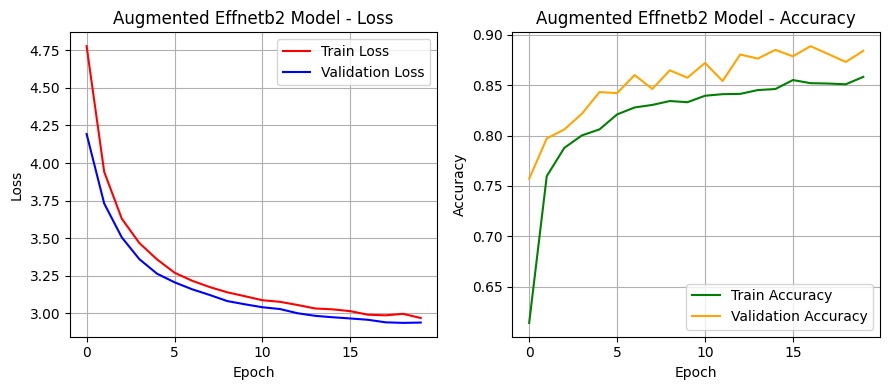

In [240]:
plot_loss_and_accuracy_curves(aug_effnetb2_results_df, model_name="Augmented Effnetb2")

Yay!  This loss curve looks like an improvement from the base Efficient Net model.  The model is no longer overfitting on the training data and has a nice decline.

<h3>Loss and Accuracy Plots for Genre and Style</h3>

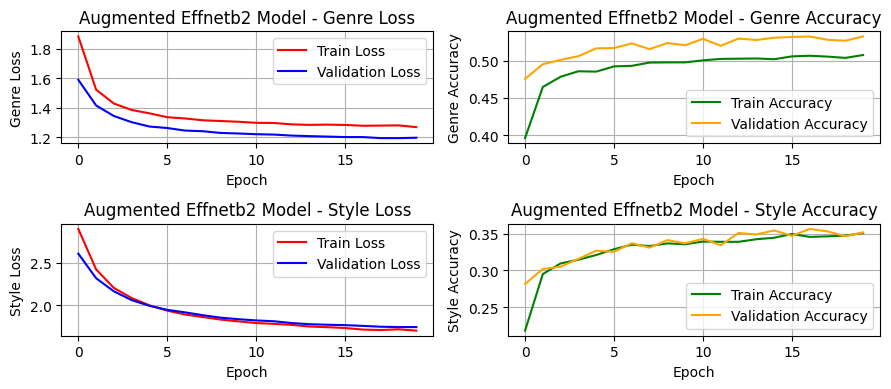

In [241]:
plot_loss_and_accuracy_curves_for_labels(aug_effnetb2_results_df, model_name="Augmented Effnetb2")

The model's accuracy for style labels remains lower compared to genre labels. Additionally, there may be concerns about its ability to generalize to unseen data for style classification.

<h3>Plot F1 Score for Training and Validation</h3>

How is the model doing on average between "harmonic mean" between Precision and Recall?

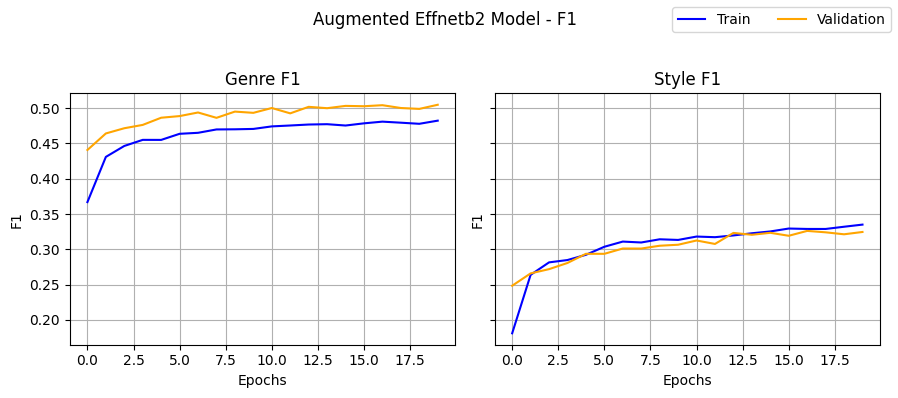

In [242]:
# getting f1 score
aug_effnetb2_f1_scores = pd.DataFrame(get_metrics(results=aug_effnetb2_results_df, metric=Metric.F1))

# plot results
plot_metrics(results=aug_effnetb2_f1_scores,
                             model_name="Augmented Effnetb2",
                             metric=Metric.F1)

The model still have a slight increase in the style F1 score.  This is identical to the base model.

<h3>Plot Precision Score per Threashold for Training and Validation</h3>

Out of all the positive predictions, how many of them were correct?



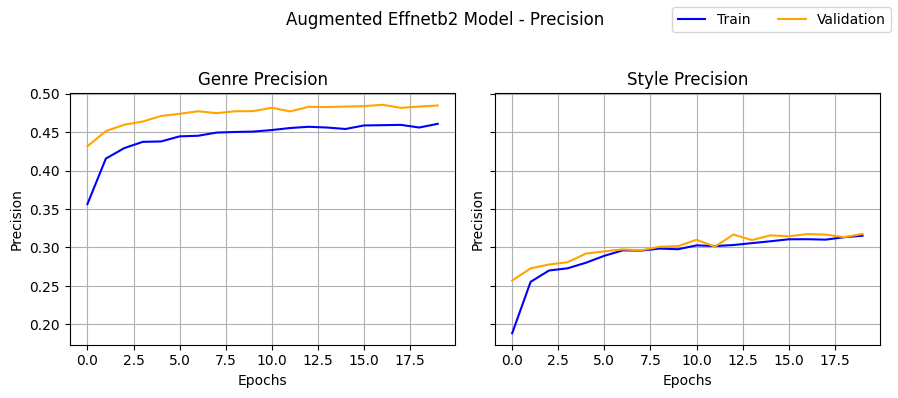

In [243]:
# getting precision score
aug_effnetb2_precision_scores = pd.DataFrame(get_metrics(results=aug_effnetb2_results_df, metric=Metric.PRECISION))

# plot results
plot_metrics(results=aug_effnetb2_precision_scores,
                             model_name="Augmented Effnetb2",
                             metric=Metric.PRECISION)

There are slight diffrences from the base model.


<h3>Plot Recall Score per Threashold for Training and Validation</h3>

Out of all the positive cases available, how many did the model find?


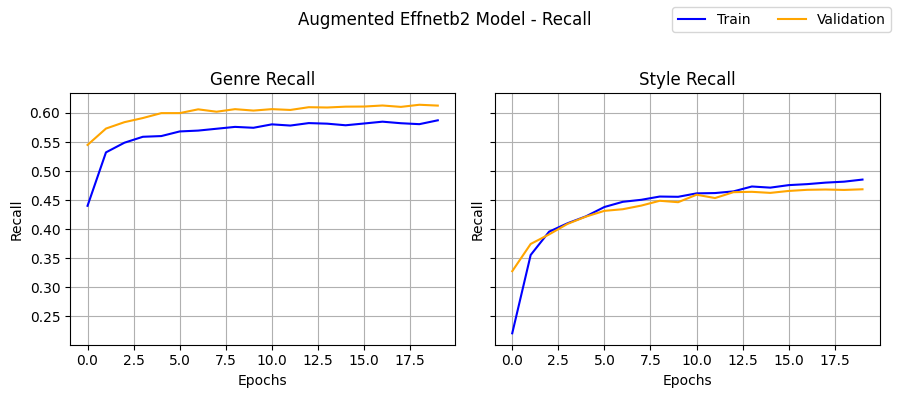

In [244]:
# getting recall score
aug_effnetb2_recall_scores = pd.DataFrame(get_metrics(results=aug_effnetb2_results_df, metric=Metric.RECALL))

# plot results
plot_metrics(results=aug_effnetb2_recall_scores,
                             model_name="Augmented Effnetb2",
                             metric=Metric.RECALL)

I think the recall looks slightly better, maybe.

<h3>Predicting on Unseen Data</h3>

Next, I'll make predictions on a selection of random images from the test data. I must admit, visualizing how accurately these predictions match the ground truth is the most exciting part of the process.


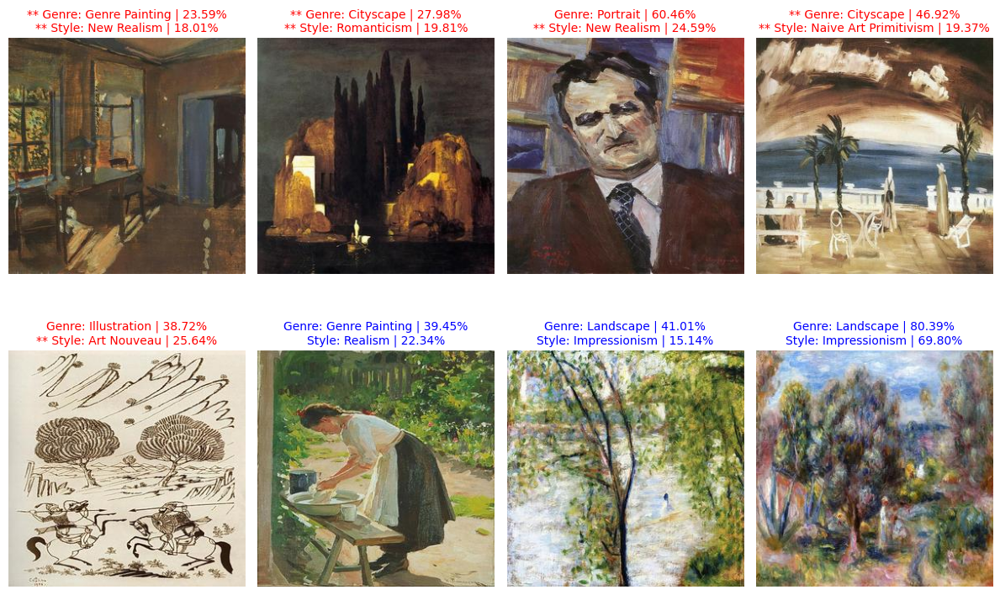

In [247]:
test_images = test_dir / 'images'

predict_random_test_images(model=aug_effnetb2,
                           test_dir=test_images,
                           annotations_df=test_annotations,
                           transform=effnetb2_transforms)

The EffNetB2 model, even with data augmentation, is still making frequent incorrect predictions. It might be time to move on from EfficientNet models and experiment with transformers. Transformers have shown superior performance compared to convolutional neural networks in many cases, so I'm optimistic about seeing improved results with them.

<h3>Collect Test Metrics</h3>

Feeding the model unseen data and collecting the loss, accuracy, f1 score, precision score, and recall score.  This will assist comparing the model to the others and deciding which is the best performing model.

In [250]:
metrics = evaluate_model(model=aug_effnetb2,
                    model_name = 'aug_effnetb2',
                    dataloader = test_dataloader,
                    device = device,
                    num_genres = len(genres))

temp_df = pd.DataFrame([metrics])
df_metrics = pd.concat([df_metrics, temp_df], ignore_index=True)
df_metrics.head()

Testing...: 100%|██████████| 204/204 [00:10<00:00, 18.68it/s]


,genre_accuracy,style_accuracy,genre_precision,style_precision,genre_recall,style_recall,genre_f1,style_f1,model_name
0,0.565157,0.387567,0.511124,0.336294,0.643357,0.488628,0.533271,0.35278,base_effnetb2
1,0.540752,0.354720,0.490573,0.315078,0.625849,0.464253,0.511842,0.32213,aug_effnetb2


### Experiment 3 (ViT)

In [251]:
# Get pretrained weights for ViT-Base
base_pretrained_vit_weights = torchvision.models.ViT_B_16_Weights.DEFAULT

# Setup a ViT model instance with pretrained weights
base_pretrained_vit = torchvision.models.vit_b_16(weights=base_pretrained_vit_weights).to(device)

# Upate the classifier head
set_seeds()

Downloading: "https://download.pytorch.org/models/vit_b_16-c867db91.pth" to /root/.cache/torch/hub/checkpoints/vit_b_16-c867db91.pth
100%|██████████| 330M/330M [00:01<00:00, 197MB/s]


In [252]:
vit_transforms = base_pretrained_vit_weights.transforms()
vit_transforms

ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)

In [253]:
from torchinfo import summary

summary(model=base_pretrained_vit,
        input_size=(1, 3, 224, 224),
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
VisionTransformer (VisionTransformer)                        [1, 3, 224, 224]     [1, 1000]            768                  True
├─Conv2d (conv_proj)                                         [1, 3, 224, 224]     [1, 768, 14, 14]     590,592              True
├─Encoder (encoder)                                          [1, 197, 768]        [1, 197, 768]        151,296              True
│    └─Dropout (dropout)                                     [1, 197, 768]        [1, 197, 768]        --                   --
│    └─Sequential (layers)                                   [1, 197, 768]        [1, 197, 768]        --                   True
│    │    └─EncoderBlock (encoder_layer_0)                   [1, 197, 768]        [1, 197, 768]        7,087,872            True
│    │    └─EncoderBlock (encoder_layer_1)                   [1, 197, 768]        [1, 197, 768

In [254]:
base_pretrained_vit.heads

Sequential(
  (head): Linear(in_features=768, out_features=1000, bias=True)
)

The ViT model is significantly larger than EfficientNet. I will freeze all layers except for the output layer, where I'll update the number of class names and add a sigmoid activation function for multilabel classification.

#### Create Model

In [285]:
import torch
from torch import nn
import torchvision

class ViT_B_16_Model(nn.Module):
    def __init__(self, num_genres, num_styles):
        super(ViT_B_16_Model, self).__init__()

        # load the pre-trained ViT-B-16 model
        self.pretrained_model = torchvision.models.vit_b_16(weights=torchvision.models.ViT_B_16_Weights.DEFAULT)

        # freeze all layers in the pre-trained ViT-B-16 backbone
        for param in self.pretrained_model.parameters():
            param.requires_grad = False

        # Replace the classifier with a new one
        self.pretrained_model.heads = nn.Identity()

        self.dropout = nn.Dropout(p=0.3)

        # define separate heads for genre and style
        in_features = 768  # hardcoded based on ViT-B-16 model's output dimension
        self.genre_head = nn.Linear(in_features, num_genres)
        self.style_head = nn.Linear(in_features, num_styles)

    def forward(self, x):
        # pass input through the pre-trained model
        x = self.pretrained_model(x)
        x = self.dropout(x)

        # pass through genre and style heads
        genre = self.genre_head(x)
        style = self.style_head(x)

        return genre, style


In [286]:
base_vitb16 = ViT_B_16_Model(num_genres=len(genres), num_styles=len(styles)).to(device)

summary(base_vitb16,
        input_size=(1, 3, 224, 224),
        col_names=['input_size','output_size','num_params','trainable'],
        col_width=20,
        row_settings=['var_names'])

Layer (type (var_name))                                           Input Shape          Output Shape         Param #              Trainable
ViT_B_16_Model (ViT_B_16_Model)                                   [1, 3, 224, 224]     [1, 11]              --                   Partial
├─VisionTransformer (pretrained_model)                            [1, 3, 224, 224]     [1, 768]             768                  False
│    └─Conv2d (conv_proj)                                         [1, 3, 224, 224]     [1, 768, 14, 14]     (590,592)            False
│    └─Encoder (encoder)                                          [1, 197, 768]        [1, 197, 768]        151,296              False
│    │    └─Dropout (dropout)                                     [1, 197, 768]        [1, 197, 768]        --                   --
│    │    └─Sequential (layers)                                   [1, 197, 768]        [1, 197, 768]        (85,054,464)         False
│    │    └─LayerNorm (ln)                          


*   2 output layers, genre and style
*   genre has 11 classes
*  style has 27 classes
*   29,222 trainable params

Looks good!



#### Create Dataloaders

In [287]:
train_dataloader, val_dataloader, test_dataloader= data_setup(train_transform=vit_transforms,
                                                                          test_transform=vit_transforms,
                                                                          train_annotations=train_annotations_path,
                                                                          val_annotations=val_annotations_path,
                                                                          test_annotations=test_annotations_path,
                                                                          train_images=train_images_path,
                                                                          val_images=val_images_path,
                                                                          test_images=test_images_path,
                                                                          num_workers=NUM_WORKERS,
                                                                          num_genres=len(genres),
                                                                          batch_size=BATCH_SIZE)

#### Train Model

In [290]:
from torch.optim.lr_scheduler import ReduceLROnPlateau

genre_class_weights_tensor = get_class_weights(train_annotations, for_genre=True, num_classes=len(genres))
style_class_weights_tensor = get_class_weights(train_annotations, for_genre=False, num_classes=len(styles))

# create loss functions with the balanced weights
genre_loss_fn = nn.CrossEntropyLoss(weight= genre_class_weights_tensor)
style_loss_fn = nn.CrossEntropyLoss(weight= style_class_weights_tensor)

# init optimizer with L2 regularization
optimizer = optim.AdamW(base_vitb16.parameters(), lr=1e-4, weight_decay=1e-5)

In [291]:
# Training function
set_seeds()

with track_time():
  base_vitb16_results = train(model=base_vitb16,
                                train_dataloader=train_dataloader,
                                validation_dataloader=val_dataloader,
                                optimizer=optimizer,
                                genre_loss_fn=genre_loss_fn,
                                style_loss_fn=style_loss_fn,
                                epochs=EPOCHS,
                                num_genres=len(genres),
                                device=device)

  5%|▌         | 1/20 [04:04<1:17:34, 244.95s/it]

Epoch: 1 | Train: Avg Loss: 4.2625 | Avg Accuracy: 0.7044
 | Val: Avg Loss: 3.5236 | Avg Accuracy: 0.8663



 10%|█         | 2/20 [08:10<1:13:32, 245.12s/it]

Epoch: 2 | Train: Avg Loss: 3.3110 | Avg Accuracy: 0.8833
 | Val: Avg Loss: 3.1267 | Avg Accuracy: 0.9156



 15%|█▌        | 3/20 [12:15<1:09:27, 245.14s/it]

Epoch: 3 | Train: Avg Loss: 3.0074 | Avg Accuracy: 0.9285
 | Val: Avg Loss: 2.9419 | Avg Accuracy: 0.9493



 20%|██        | 4/20 [16:20<1:05:22, 245.17s/it]

Epoch: 4 | Train: Avg Loss: 2.8509 | Avg Accuracy: 0.9522
 | Val: Avg Loss: 2.8312 | Avg Accuracy: 0.9637



 25%|██▌       | 5/20 [20:25<1:01:17, 245.18s/it]

Epoch: 5 | Train: Avg Loss: 2.7372 | Avg Accuracy: 0.9705
 | Val: Avg Loss: 2.7558 | Avg Accuracy: 0.9815



 30%|███       | 6/20 [24:30<57:12, 245.16s/it]  

Epoch: 6 | Train: Avg Loss: 2.6564 | Avg Accuracy: 0.9837
 | Val: Avg Loss: 2.6996 | Avg Accuracy: 0.9931



 35%|███▌      | 7/20 [28:36<53:08, 245.23s/it]

Epoch: 7 | Train: Avg Loss: 2.6011 | Avg Accuracy: 0.9939
 | Val: Avg Loss: 2.6595 | Avg Accuracy: 1.0092



 40%|████      | 8/20 [32:41<49:02, 245.19s/it]

Epoch: 8 | Train: Avg Loss: 2.5549 | Avg Accuracy: 1.0020
 | Val: Avg Loss: 2.6260 | Avg Accuracy: 1.0071



 45%|████▌     | 9/20 [36:46<44:57, 245.25s/it]

Epoch: 9 | Train: Avg Loss: 2.5187 | Avg Accuracy: 1.0075
 | Val: Avg Loss: 2.6021 | Avg Accuracy: 1.0177



 50%|█████     | 10/20 [40:52<40:53, 245.31s/it]

Epoch: 10 | Train: Avg Loss: 2.4863 | Avg Accuracy: 1.0137
 | Val: Avg Loss: 2.5797 | Avg Accuracy: 1.0174



 55%|█████▌    | 11/20 [44:57<36:48, 245.36s/it]

Epoch: 11 | Train: Avg Loss: 2.4721 | Avg Accuracy: 1.0160
 | Val: Avg Loss: 2.5607 | Avg Accuracy: 1.0203



 60%|██████    | 12/20 [49:02<32:42, 245.32s/it]

Epoch: 12 | Train: Avg Loss: 2.4439 | Avg Accuracy: 1.0183
 | Val: Avg Loss: 2.5464 | Avg Accuracy: 1.0230



 65%|██████▌   | 13/20 [53:08<28:37, 245.31s/it]

Epoch: 13 | Train: Avg Loss: 2.4237 | Avg Accuracy: 1.0249
 | Val: Avg Loss: 2.5327 | Avg Accuracy: 1.0285



 70%|███████   | 14/20 [57:13<24:31, 245.32s/it]

Epoch: 14 | Train: Avg Loss: 2.4056 | Avg Accuracy: 1.0281
 | Val: Avg Loss: 2.5249 | Avg Accuracy: 1.0341



 75%|███████▌  | 15/20 [1:01:19<20:26, 245.39s/it]

Epoch: 15 | Train: Avg Loss: 2.3971 | Avg Accuracy: 1.0258
 | Val: Avg Loss: 2.5153 | Avg Accuracy: 1.0345



 80%|████████  | 16/20 [1:05:24<16:21, 245.31s/it]

Epoch: 16 | Train: Avg Loss: 2.3793 | Avg Accuracy: 1.0291
 | Val: Avg Loss: 2.5062 | Avg Accuracy: 1.0331



 85%|████████▌ | 17/20 [1:09:29<12:15, 245.23s/it]

Epoch: 17 | Train: Avg Loss: 2.3647 | Avg Accuracy: 1.0312
 | Val: Avg Loss: 2.5016 | Avg Accuracy: 1.0427



 90%|█████████ | 18/20 [1:13:34<08:10, 245.17s/it]

Epoch: 18 | Train: Avg Loss: 2.3574 | Avg Accuracy: 1.0331
 | Val: Avg Loss: 2.4972 | Avg Accuracy: 1.0394



 95%|█████████▌| 19/20 [1:17:39<04:05, 245.25s/it]

Epoch: 19 | Train: Avg Loss: 2.3474 | Avg Accuracy: 1.0317
 | Val: Avg Loss: 2.4908 | Avg Accuracy: 1.0404



100%|██████████| 20/20 [1:21:45<00:00, 245.26s/it]

Epoch: 20 | Train: Avg Loss: 2.3396 | Avg Accuracy: 1.0325
 | Val: Avg Loss: 2.4863 | Avg Accuracy: 1.0449

Execution time: 4905.11s


<h3>My First Thoughts:</h3>
Initially, I anticipated impressive results from the model, but things took a downturn around epoch 6. The model is exhibiting significant overfitting, potentially more than any previous model I’ve worked with. While the accuracy might suggest this model is exceptionally accurate, it’s more likely that it will struggle with unseen data. We should thoroughly review the metrics and evaluate the model on the test data to get a clearer picture of its performance.

####Model Performance Evaluation
In this section, I will evaluate model performance. I will plotting the following..

* Loss curve for combination of artist, genre, and style losses:  If the trend is descending, which it is, then it's converging.
* Genre and style accuracies: The proportion of correctly predicted labels to the total number of labels for each instance. The higher the score, the better the model's performance.
* Average F1 Score for each label
* Average Recall Score for each label
* Average Precision Score for each label
* Finally, predictions will be made on the test data, and the results will be displayed.

In [292]:
# taking a look at the results
base_vitb16_results_df = pd.DataFrame(base_vitb16_results)
base_vitb16_results_df.head()

,train_avg_loss,train_avg_accuracy,train_genre_loss,train_style_loss,train_genre_acc,train_style_acc,train_genre_preds,train_style_preds,train_genre_labels,train_style_labels,val_avg_loss,val_avg_accuracy,val_genre_loss,val_style_loss,val_genre_acc,val_style_acc,val_genre_preds,val_style_preds,val_genre_labels,val_style_labels
0,4.262491,0.704397,1.584551,2.677940,0.466739,0.237658,"[4, 5, 7, 8, 2, 6, 9, 5, 6, 8, 4, 8, 7, 10, 9,...","[5, 10, 13, 26, 10, 14, 25, 26, 2, 14, 3, 8, 1...","[10, 2, 7, 10, 10, 1, 10, 2, 7, 4, 6, 2, 9, 2,...","[4, 20, 4, 13, 24, 3, 3, 9, 24, 23, 12, 7, 21,...",3.523605,0.866255,1.263335,2.260270,0.543846,0.322409,"[9, 6, 3, 7, 1, 4, 1, 6, 4, 2, 4, 6, 8, 4, 7, ...","[24, 22, 3, 13, 7, 24, 12, 21, 16, 18, 12, 13,...","[4, 6, 10, 10, 1, 4, 1, 6, 4, 10, 4, 7, 8, 4, ...","[24, 12, 3, 4, 3, 24, 12, 12, 15, 24, 12, 13, ..."
1,3.311025,0.883269,1.221395,2.089629,0.545481,0.337789,"[4, 10, 7, 4, 1, 5, 4, 7, 6, 8, 7, 6, 7, 4, 1,...","[12, 24, 26, 12, 21, 10, 12, 8, 22, 24, 8, 7, ...","[4, 7, 6, 4, 1, 2, 2, 10, 6, 6, 7, 6, 7, 10, 2...","[21, 24, 6, 21, 22, 9, 12, 4, 12, 17, 13, 7, 1...",3.126714,0.915608,1.154627,1.972087,0.560886,0.354722,"[10, 6, 3, 7, 1, 4, 1, 6, 4, 2, 4, 6, 8, 4, 7,...","[24, 22, 25, 13, 2, 24, 12, 21, 16, 18, 12, 13...","[4, 6, 10, 10, 1, 4, 1, 6, 4, 10, 4, 7, 8, 4, ...","[24, 12, 3, 4, 3, 24, 12, 12, 15, 24, 12, 13, ..."
2,3.007399,0.928525,1.142717,1.864682,0.561466,0.367058,"[2, 4, 4, 5, 0, 6, 1, 8, 8, 1, 4, 4, 4, 8, 6, ...","[12, 6, 12, 9, 19, 23, 23, 1, 9, 16, 21, 21, 2...","[2, 10, 4, 7, 10, 7, 1, 0, 8, 2, 4, 4, 2, 7, 6...","[12, 23, 20, 15, 19, 17, 12, 1, 11, 9, 21, 23,...",2.941933,0.949265,1.108348,1.833585,0.569789,0.379476,"[10, 6, 3, 7, 1, 4, 1, 6, 4, 4, 4, 6, 8, 4, 7,...","[24, 22, 25, 13, 2, 24, 20, 21, 6, 18, 21, 13,...","[4, 6, 10, 10, 1, 4, 1, 6, 4, 10, 4, 7, 8, 4, ...","[24, 12, 3, 4, 3, 24, 12, 12, 15, 24, 12, 13, ..."
3,2.850859,0.952166,1.101369,1.749490,0.569920,0.382246,"[9, 3, 2, 8, 3, 4, 2, 4, 4, 0, 4, 3, 6, 10, 6,...","[10, 7, 21, 26, 19, 6, 22, 21, 12, 1, 6, 17, 8...","[10, 10, 2, 2, 10, 4, 2, 4, 1, 0, 4, 7, 7, 10,...","[9, 7, 21, 9, 3, 21, 22, 23, 9, 1, 12, 17, 8, ...",2.831237,0.963657,1.082322,1.748915,0.573282,0.390375,"[10, 6, 3, 7, 1, 4, 1, 6, 4, 4, 4, 7, 8, 4, 7,...","[24, 22, 25, 13, 3, 24, 20, 21, 15, 18, 21, 13...","[4, 6, 10, 10, 1, 4, 1, 6, 4, 10, 4, 7, 8, 4, ...","[24, 12, 3, 4, 3, 24, 12, 12, 15, 24, 12, 13, ..."
4,2.737166,0.970546,1.078115,1.659050,0.575405,0.395141,"[4, 6, 4, 6, 4, 5, 10, 6, 2, 4, 0, 9, 0, 8, 6,...","[24, 10, 23, 4, 23, 6, 8, 22, 23, 12, 3, 25, 0...","[4, 6, 4, 10, 4, 5, 10, 6, 2, 4, 2, 9, 6, 2, 6...","[12, 12, 23, 21, 23, 6, 12, 9, 24, 12, 9, 23, ...",2.755816,0.981540,1.064524,1.691292,0.581456,0.400084,"[10, 6, 3, 7, 1, 4, 1, 6, 4, 4, 4, 7, 8, 4, 7,...","[24, 12, 25, 13, 3, 24, 20, 21, 15, 18, 21, 13...","[4, 6, 10, 10, 1, 4, 1, 6, 4, 10, 4, 7, 8, 4, ...","[24, 12, 3, 4, 3, 24, 12, 12, 15, 24, 12, 13, ..."


<h3>Loss and Accuracy Plots for Training and Validation</h3>

This plot visualizes the training and validation loss and accuracy values per epoch. It helps in understanding whether the model is learning effectively and in identifying any signs of overfitting or underfitting.

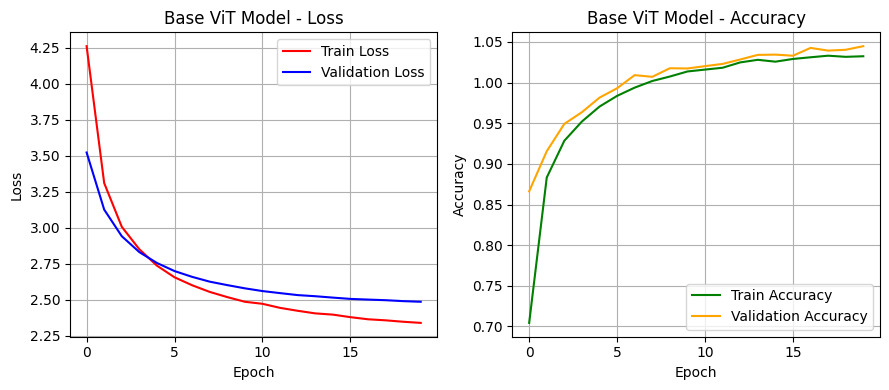

In [293]:
plot_loss_and_accuracy_curves(base_vitb16_results_df, model_name="Base ViT")

The model is overfitting on the training data.  Adding augmentation to the EffNet model helped that so I will like to see what image augmentation does for the ViT model in the next experiment.  The validation accuracy is higher than the training accuracy which is very interesting.

<h3>Loss and Accuracy Plots for Genre and Style</h3>

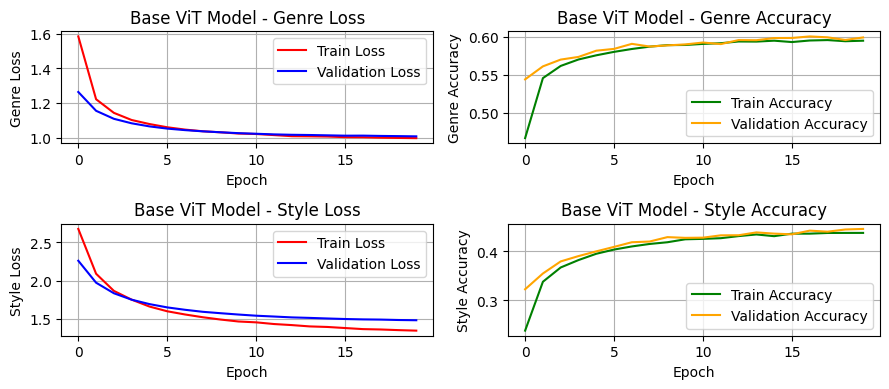

In [294]:
plot_loss_and_accuracy_curves_for_labels(base_vitb16_results_df, model_name="Base ViT")

The ViT model has a better accuracy on the style label, which is awesome.  It's still under the genre accuracy but it's a lot closer.

<h3>Plot F1 Score for Training and Validation</h3>

How is the model doing on average between "harmonic mean" between Precision and Recall?

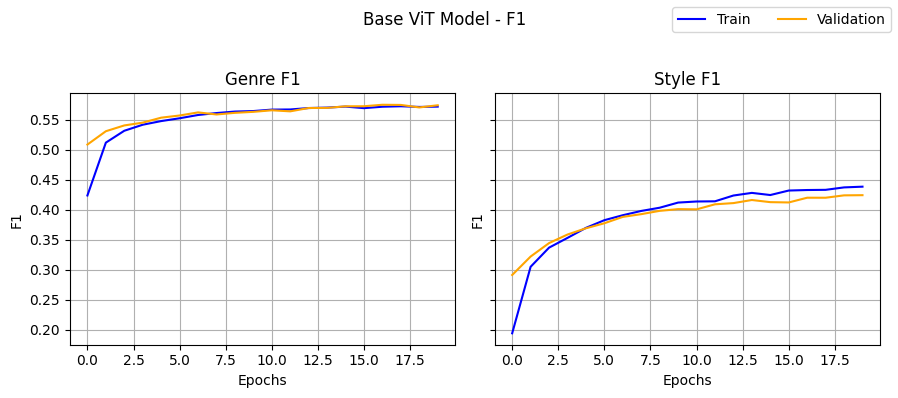

In [295]:
# getting f1 score
base_vitb16_f1_scores = pd.DataFrame(get_metrics(results=base_vitb16_results_df, metric=Metric.F1))

# plot results
plot_metrics(results=base_vitb16_f1_scores,
                             model_name="Base ViT",
                             metric=Metric.F1)

The F1 scores look better than the Efficient Net F1 scores. Looks like the ViT model may know a little more about styles than the previous models.

<h3>Plot Precision Score per Threashold for Training and Validation</h3>

Out of all the positive predictions, how many of them were correct?


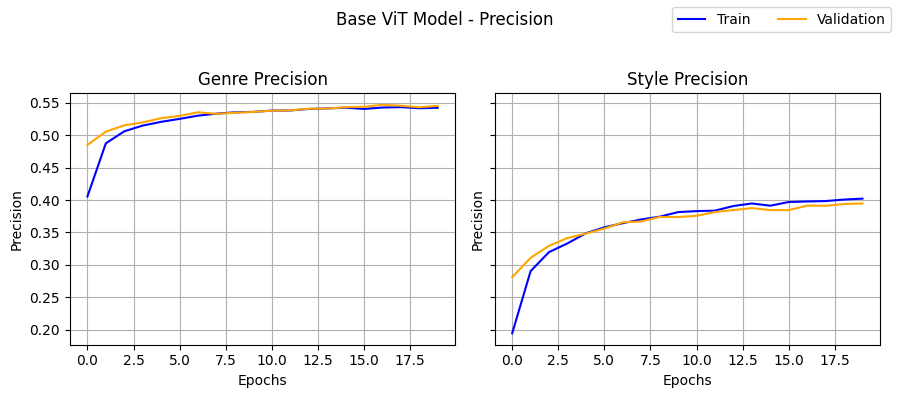

In [296]:
# getting precision score
base_vitb16_precision_scores = pd.DataFrame(get_metrics(results=base_vitb16_results_df, metric=Metric.PRECISION))

# plot results
plot_metrics(results=base_vitb16_precision_scores,
                             model_name="Base ViT",
                             metric=Metric.PRECISION)

The model is picking the correct style label more **~40%** of the time, which is an increase from the EffNet models. It's **> 50%** for the genre label.

<h3>Plot Recall Score per Threashold for Training and Validation</h3>

Out of all the positive cases available, how many did the model find?

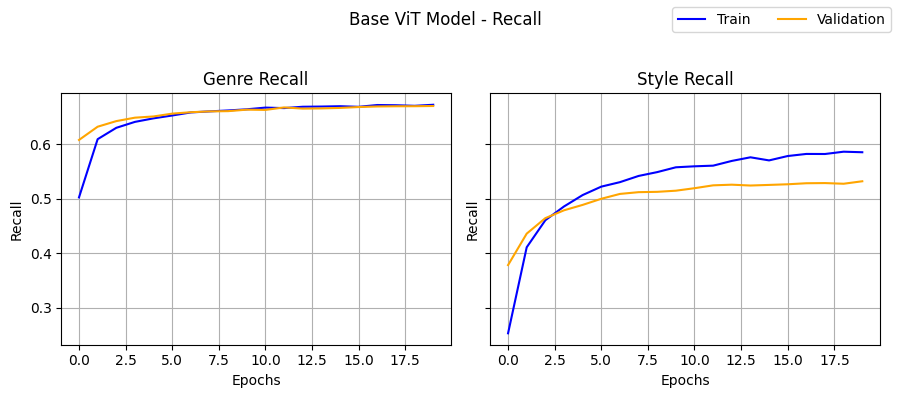

In [297]:
# getting recall score
base_vitb16__recall_scores = pd.DataFrame(get_metrics(results=base_vitb16_results_df, metric=Metric.RECALL))

# plot results
plot_metrics(results=base_vitb16__recall_scores,
                             model_name="Base ViT",
                             metric=Metric.RECALL)

It appears that the overfitting is primarily affecting the style label. The lower recall value on the validation data indicates that the model is missing a significant portion of the correct style labels. In other words, the model is not identifying all the actual style labels among the available correct ones.

<h3>Predicting on Unseen Data</h3>

Next, I'll make predictions on a selection of random images from the test data. I must admit, visualizing how accurately these predictions match the ground truth is the most exciting part of the process.

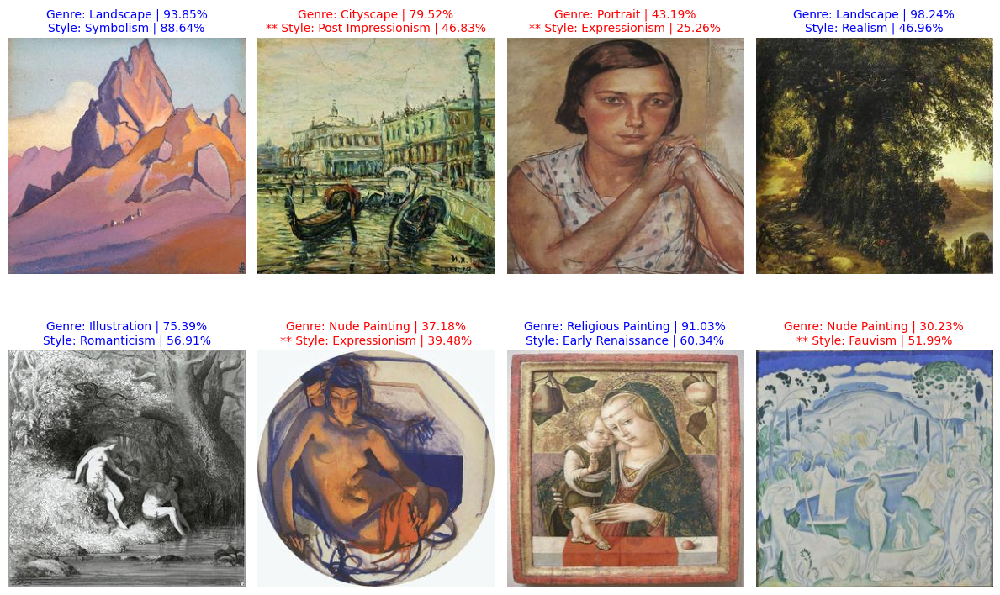

In [298]:
test_images = test_dir / 'images'

predict_random_test_images(model=base_vitb16,
                           test_dir=test_images,
                           annotations_df=test_annotations,
                           transform=vit_transforms)

The model achieved outstanding results on the genre label, correctly predicting the genre for every image. However, the validation loss and recall metrics suggest that the model struggled with the style labels, missing approximately half of them. This performance discrepancy aligns with the observed metrics.

<h3>Collect Test Metrics</h3>

Feeding the model unseen data and collecting the loss, accuracy, f1 score, precision score, and recall score.  This will assist comparing the model to the others and deciding which is the best performing model.

In [299]:
metrics = evaluate_model(model=base_vitb16,
                    model_name = 'base_vitb16',
                    dataloader = test_dataloader,
                    device = device,
                    num_genres = len(genres))

temp_df = pd.DataFrame([metrics])
df_metrics = pd.concat([df_metrics, temp_df], ignore_index=True)
df_metrics.head()

Testing...: 100%|██████████| 204/204 [00:19<00:00, 10.35it/s]


,genre_accuracy,style_accuracy,genre_precision,style_precision,genre_recall,style_recall,genre_f1,style_f1,model_name
0,0.565157,0.387567,0.511124,0.336294,0.643357,0.488628,0.533271,0.352780,base_effnetb2
1,0.540752,0.354720,0.490573,0.315078,0.625849,0.464253,0.511842,0.322130,aug_effnetb2
2,0.610744,0.453262,0.554309,0.401147,0.676999,0.537276,0.582899,0.431382,base_vitb16


### Experiment 4 (Augmented ViT)

#### Create Model

In [300]:
aug_vitb16 = ViT_B_16_Model(num_genres=len(genres), num_styles=len(styles)).to(device)

In [301]:
from torchvision import transforms

# create transforms
aug_vitb16_transforms = torchvision.transforms.Compose([transforms.RandomHorizontalFlip(),
                                                        transforms.RandomRotation(20),
                                                        transforms.RandomVerticalFlip(),
                                                        vit_transforms])
aug_vitb16_transforms

Compose(
    RandomHorizontalFlip(p=0.5)
    RandomRotation(degrees=[-20.0, 20.0], interpolation=nearest, expand=False, fill=0)
    RandomVerticalFlip(p=0.5)
    ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)
)

In [302]:
# just to be sure everything is what I expect
summary(aug_vitb16,
        input_size=(1, 3, 224, 224),
        col_names=['input_size','output_size','num_params','trainable'],
        col_width=20,
        row_settings=['var_names'])

Layer (type (var_name))                                           Input Shape          Output Shape         Param #              Trainable
ViT_B_16_Model (ViT_B_16_Model)                                   [1, 3, 224, 224]     [1, 11]              --                   Partial
├─VisionTransformer (pretrained_model)                            [1, 3, 224, 224]     [1, 768]             768                  False
│    └─Conv2d (conv_proj)                                         [1, 3, 224, 224]     [1, 768, 14, 14]     (590,592)            False
│    └─Encoder (encoder)                                          [1, 197, 768]        [1, 197, 768]        151,296              False
│    │    └─Dropout (dropout)                                     [1, 197, 768]        [1, 197, 768]        --                   --
│    │    └─Sequential (layers)                                   [1, 197, 768]        [1, 197, 768]        (85,054,464)         False
│    │    └─LayerNorm (ln)                          

#### Create Dataloaders

In [303]:
train_dataloader, val_dataloader, test_dataloader= data_setup(train_transform=aug_vitb16_transforms,
                                                                          test_transform=vit_transforms,
                                                                          train_annotations=train_annotations_path,
                                                                          val_annotations=val_annotations_path,
                                                                          test_annotations=test_annotations_path,
                                                                          train_images=train_images_path,
                                                                          val_images=val_images_path,
                                                                          test_images=test_images_path,
                                                                          num_workers=NUM_WORKERS,
                                                                          num_genres=len(genres),
                                                                          batch_size=BATCH_SIZE)

#### Train Model

In [304]:
from torch.optim.lr_scheduler import ReduceLROnPlateau

genre_class_weights_tensor = get_class_weights(train_annotations, for_genre=True, num_classes=len(genres))
style_class_weights_tensor = get_class_weights(train_annotations, for_genre=False, num_classes=len(styles))

# create loss functions with the balanced weights
genre_loss_fn = nn.CrossEntropyLoss(weight= genre_class_weights_tensor)
style_loss_fn = nn.CrossEntropyLoss(weight= style_class_weights_tensor)

# init optimizer with L2 regularization
optimizer = optim.AdamW(aug_vitb16.parameters(), lr=1e-4, weight_decay=1e-5)

In [305]:
# Training function
set_seeds()

with track_time():
  aug_vit_results = train(model=aug_vitb16,
                                train_dataloader=train_dataloader,
                                validation_dataloader=val_dataloader,
                                optimizer=optimizer,
                                genre_loss_fn=genre_loss_fn,
                                style_loss_fn=style_loss_fn,
                                epochs=EPOCHS,
                                num_genres=len(genres),
                                device=device)

  5%|▌         | 1/20 [04:05<1:17:45, 245.58s/it]

Epoch: 1 | Train: Avg Loss: 4.4451 | Avg Accuracy: 0.6305
 | Val: Avg Loss: 3.6819 | Avg Accuracy: 0.8312



 10%|█         | 2/20 [08:11<1:13:40, 245.56s/it]

Epoch: 2 | Train: Avg Loss: 3.5271 | Avg Accuracy: 0.8132
 | Val: Avg Loss: 3.2728 | Avg Accuracy: 0.8880



 15%|█▌        | 3/20 [12:16<1:09:34, 245.55s/it]

Epoch: 3 | Train: Avg Loss: 3.2412 | Avg Accuracy: 0.8585
 | Val: Avg Loss: 3.0803 | Avg Accuracy: 0.9247



 20%|██        | 4/20 [16:22<1:05:27, 245.47s/it]

Epoch: 4 | Train: Avg Loss: 3.0820 | Avg Accuracy: 0.8793
 | Val: Avg Loss: 2.9642 | Avg Accuracy: 0.9366



 25%|██▌       | 5/20 [20:27<1:01:22, 245.48s/it]

Epoch: 5 | Train: Avg Loss: 2.9843 | Avg Accuracy: 0.8952
 | Val: Avg Loss: 2.8931 | Avg Accuracy: 0.9534



 30%|███       | 6/20 [24:32<57:16, 245.46s/it]  

Epoch: 6 | Train: Avg Loss: 2.9072 | Avg Accuracy: 0.9071
 | Val: Avg Loss: 2.8334 | Avg Accuracy: 0.9633



 35%|███▌      | 7/20 [28:38<53:10, 245.43s/it]

Epoch: 7 | Train: Avg Loss: 2.8543 | Avg Accuracy: 0.9155
 | Val: Avg Loss: 2.7909 | Avg Accuracy: 0.9737



 40%|████      | 8/20 [32:43<49:03, 245.30s/it]

Epoch: 8 | Train: Avg Loss: 2.8182 | Avg Accuracy: 0.9220
 | Val: Avg Loss: 2.7544 | Avg Accuracy: 0.9743



 45%|████▌     | 9/20 [36:48<44:57, 245.23s/it]

Epoch: 9 | Train: Avg Loss: 2.7778 | Avg Accuracy: 0.9286
 | Val: Avg Loss: 2.7290 | Avg Accuracy: 0.9842



 50%|█████     | 10/20 [40:53<40:53, 245.31s/it]

Epoch: 10 | Train: Avg Loss: 2.7593 | Avg Accuracy: 0.9306
 | Val: Avg Loss: 2.7050 | Avg Accuracy: 0.9819



 55%|█████▌    | 11/20 [44:59<36:47, 245.29s/it]

Epoch: 11 | Train: Avg Loss: 2.7407 | Avg Accuracy: 0.9342
 | Val: Avg Loss: 2.6835 | Avg Accuracy: 0.9857



 60%|██████    | 12/20 [49:04<32:42, 245.30s/it]

Epoch: 12 | Train: Avg Loss: 2.7231 | Avg Accuracy: 0.9365
 | Val: Avg Loss: 2.6693 | Avg Accuracy: 0.9845



 65%|██████▌   | 13/20 [53:09<28:37, 245.29s/it]

Epoch: 13 | Train: Avg Loss: 2.7016 | Avg Accuracy: 0.9430
 | Val: Avg Loss: 2.6526 | Avg Accuracy: 0.9924



 70%|███████   | 14/20 [57:15<24:32, 245.34s/it]

Epoch: 14 | Train: Avg Loss: 2.6905 | Avg Accuracy: 0.9426
 | Val: Avg Loss: 2.6437 | Avg Accuracy: 0.9985



 75%|███████▌  | 15/20 [1:01:20<20:26, 245.37s/it]

Epoch: 15 | Train: Avg Loss: 2.6799 | Avg Accuracy: 0.9447
 | Val: Avg Loss: 2.6322 | Avg Accuracy: 0.9988



 80%|████████  | 16/20 [1:05:25<16:21, 245.36s/it]

Epoch: 16 | Train: Avg Loss: 2.6550 | Avg Accuracy: 0.9476
 | Val: Avg Loss: 2.6212 | Avg Accuracy: 0.9946



 85%|████████▌ | 17/20 [1:09:31<12:15, 245.29s/it]

Epoch: 17 | Train: Avg Loss: 2.6467 | Avg Accuracy: 0.9462
 | Val: Avg Loss: 2.6173 | Avg Accuracy: 1.0043



 90%|█████████ | 18/20 [1:13:36<08:10, 245.31s/it]

Epoch: 18 | Train: Avg Loss: 2.6461 | Avg Accuracy: 0.9501
 | Val: Avg Loss: 2.6059 | Avg Accuracy: 0.9979



 95%|█████████▌| 19/20 [1:17:41<04:05, 245.32s/it]

Epoch: 19 | Train: Avg Loss: 2.6366 | Avg Accuracy: 0.9500
 | Val: Avg Loss: 2.5961 | Avg Accuracy: 1.0017



100%|██████████| 20/20 [1:21:47<00:00, 245.37s/it]

Epoch: 20 | Train: Avg Loss: 2.6318 | Avg Accuracy: 0.9443
 | Val: Avg Loss: 2.5930 | Avg Accuracy: 1.0071

Execution time: 4907.37s


Amazing!!!!  The loss and accuracy results look like the best results I've gotten. Of course I will have to look at the rest of the metrics.  But at first glance it looks like adding augmentation fixed the overfitting issue.

####Model Performance Evaluation
In this section, I will evaluate model performance. I will plotting the following..

* Loss curve for combination of artist, genre, and style losses:  If the trend is descending, which it is, then it's converging.
* Genre and style accuracies: The proportion of correctly predicted labels to the total number of labels for each instance. The higher the score, the better the model's performance.
* Average F1 Score for each label
* Average Recall Score for each label
* Average Precision Score for each label
* Finally, predictions will be made on the test data, and the results will be displayed.

In [306]:
# taking a look at the results
aug_vitb16_metrics = pd.DataFrame(aug_vit_results)
aug_vitb16_metrics.head()

,train_avg_loss,train_avg_accuracy,train_genre_loss,train_style_loss,train_genre_acc,train_style_acc,train_genre_preds,train_style_preds,train_genre_labels,train_style_labels,val_avg_loss,val_avg_accuracy,val_genre_loss,val_style_loss,val_genre_acc,val_style_acc,val_genre_preds,val_style_preds,val_genre_labels,val_style_labels
0,4.445064,0.630547,1.688627,2.756437,0.415957,0.214590,"[5, 7, 9, 10, 3, 5, 5, 2, 0, 1, 9, 9, 7, 2, 4,...","[12, 19, 23, 17, 21, 14, 24, 17, 26, 21, 17, 1...","[10, 2, 7, 10, 10, 1, 10, 2, 7, 4, 6, 2, 9, 2,...","[4, 20, 4, 13, 24, 3, 3, 9, 24, 23, 12, 7, 21,...",3.681909,0.831178,1.337912,2.343997,0.527804,0.303373,"[10, 6, 3, 7, 1, 4, 1, 6, 4, 2, 4, 6, 8, 1, 7,...","[24, 22, 26, 13, 8, 20, 12, 22, 16, 18, 12, 13...","[4, 6, 10, 10, 1, 4, 1, 6, 4, 10, 4, 7, 8, 4, ...","[24, 12, 3, 4, 3, 24, 12, 12, 15, 24, 12, 13, ..."
1,3.527114,0.813227,1.343261,2.183853,0.501003,0.312224,"[4, 7, 3, 1, 1, 10, 1, 2, 6, 6, 7, 6, 7, 4, 1,...","[21, 24, 8, 12, 23, 10, 12, 22, 12, 17, 8, 7, ...","[4, 7, 6, 4, 1, 2, 2, 10, 6, 6, 7, 6, 7, 10, 2...","[21, 24, 6, 21, 22, 9, 12, 4, 12, 17, 13, 7, 1...",3.272795,0.888015,1.214619,2.058176,0.549027,0.338988,"[4, 6, 3, 7, 1, 4, 1, 6, 4, 2, 4, 6, 8, 1, 7, ...","[24, 22, 25, 13, 16, 24, 16, 22, 16, 18, 12, 1...","[4, 6, 10, 10, 1, 4, 1, 6, 4, 10, 4, 7, 8, 4, ...","[24, 12, 3, 4, 3, 24, 12, 12, 15, 24, 12, 13, ..."
2,3.241160,0.858523,1.269207,1.971952,0.519261,0.339262,"[2, 4, 4, 9, 0, 6, 4, 0, 8, 1, 4, 4, 4, 7, 6, ...","[12, 23, 12, 9, 19, 22, 21, 1, 17, 23, 21, 21,...","[2, 10, 4, 7, 10, 7, 1, 0, 8, 2, 4, 4, 2, 7, 6...","[12, 23, 20, 15, 19, 17, 12, 1, 11, 9, 21, 23,...",3.080291,0.924742,1.162856,1.917436,0.558506,0.366236,"[4, 6, 3, 7, 1, 4, 1, 6, 4, 2, 4, 6, 8, 1, 7, ...","[24, 22, 25, 13, 20, 24, 16, 21, 16, 18, 12, 1...","[4, 6, 10, 10, 1, 4, 1, 6, 4, 10, 4, 7, 8, 4, ...","[24, 12, 3, 4, 3, 24, 12, 12, 15, 24, 12, 13, ..."
3,3.081975,0.879339,1.227127,1.854847,0.528656,0.350684,"[9, 8, 2, 8, 10, 4, 2, 1, 4, 0, 2, 8, 6, 4, 6,...","[10, 3, 21, 26, 19, 21, 4, 21, 16, 1, 12, 17, ...","[10, 10, 2, 2, 10, 4, 2, 4, 1, 0, 4, 7, 7, 10,...","[9, 7, 21, 9, 3, 21, 22, 23, 9, 1, 12, 17, 8, ...",2.964167,0.936562,1.133249,1.830918,0.562152,0.374410,"[4, 6, 3, 7, 1, 4, 1, 6, 4, 2, 4, 6, 8, 4, 7, ...","[24, 22, 25, 13, 20, 24, 16, 21, 16, 18, 12, 1...","[4, 6, 10, 10, 1, 4, 1, 6, 4, 10, 4, 7, 8, 4, ...","[24, 12, 3, 4, 3, 24, 12, 12, 15, 24, 12, 13, ..."
4,2.984333,0.895161,1.204917,1.779415,0.530866,0.364295,"[4, 6, 4, 6, 4, 5, 10, 6, 2, 4, 2, 9, 0, 8, 6,...","[24, 10, 23, 11, 23, 6, 8, 22, 21, 12, 0, 25, ...","[4, 6, 4, 10, 4, 5, 10, 6, 2, 4, 2, 9, 6, 2, 6...","[12, 12, 23, 21, 23, 6, 12, 9, 24, 12, 9, 23, ...",2.893106,0.953448,1.117921,1.775186,0.568945,0.384503,"[4, 6, 3, 7, 1, 4, 1, 6, 4, 2, 4, 6, 8, 4, 7, ...","[24, 12, 25, 13, 20, 24, 20, 21, 15, 18, 12, 1...","[4, 6, 10, 10, 1, 4, 1, 6, 4, 10, 4, 7, 8, 4, ...","[24, 12, 3, 4, 3, 24, 12, 12, 15, 24, 12, 13, ..."


<h3>Loss and Accuracy Plots for Training and Validation</h3>

This plot visualizes the training and validation loss and accuracy values per epoch. It helps in understanding whether the model is learning effectively and in identifying any signs of overfitting or underfitting.

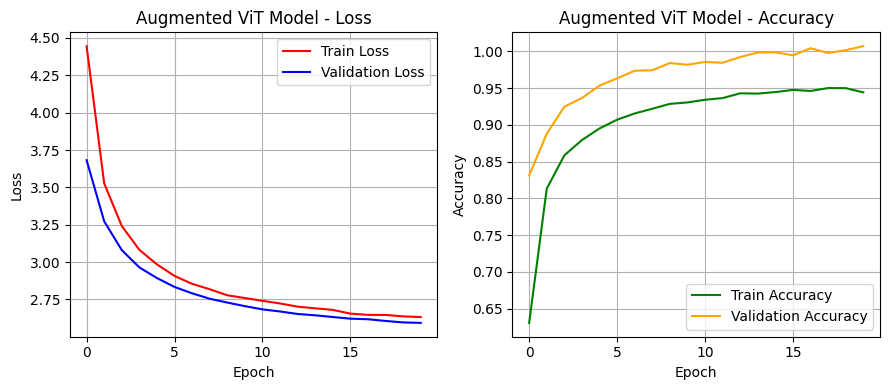

In [307]:
plot_loss_and_accuracy_curves(aug_vitb16_metrics, model_name="Augmented ViT")

The model performed well on the validation data.  There is no overfitting and the accuracy score is extremely high.

<h3>Loss and Accuracy Plots for Genre and Style</h3>

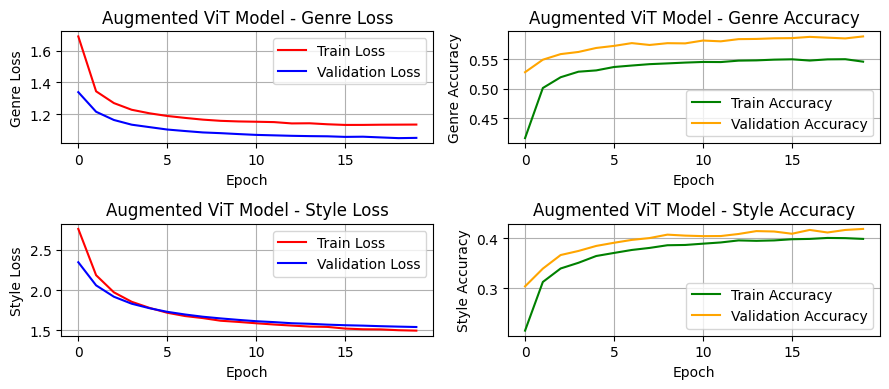

In [308]:
plot_loss_and_accuracy_curves_for_labels(aug_vitb16_metrics, model_name="Augmented ViT")

What stands out to me is that we finally have a model performing well on the style label. While it still doesn't match the genre label's performance, it surpasses all previous models in this aspect.

<h3>Plot F1 Score for Training and Validation</h3>

How is the model doing on average between "harmonic mean" between Precision and Recall?

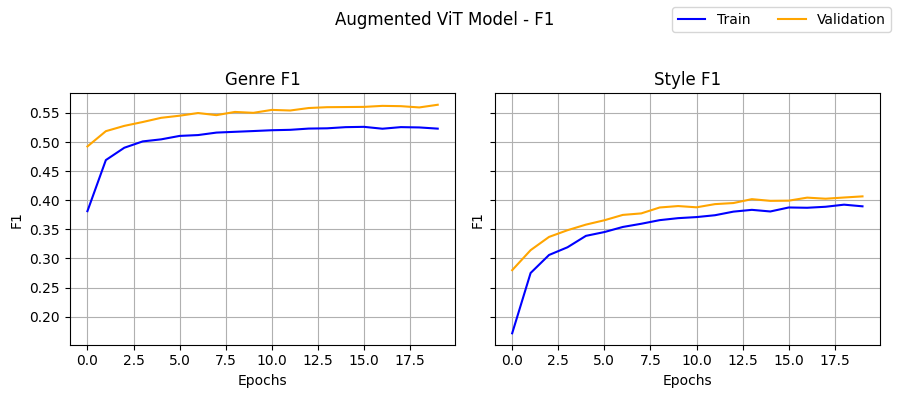

In [309]:
# getting f1 score
aug_vitb16_f1_scores = pd.DataFrame(get_metrics(results=aug_vitb16_metrics, metric=Metric.F1))

# plot results
plot_metrics(results=aug_vitb16_f1_scores,
                             model_name="Augmented ViT",
                             metric=Metric.F1)

<h3>Plot Precision Score per Threashold for Training and Validation</h3>

Out of all the positive predictions, how many of them were correct?


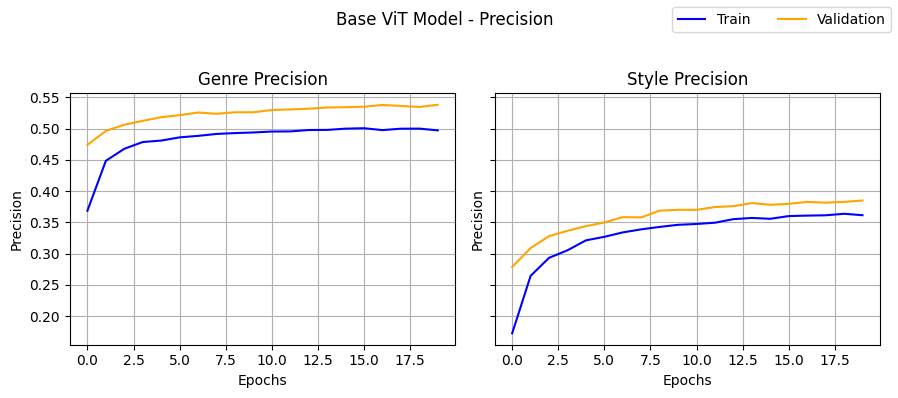

In [310]:
# getting precision score
aug_vitb16_f1_scores = pd.DataFrame(get_metrics(results=aug_vitb16_metrics, metric=Metric.PRECISION))

# plot results
plot_metrics(results=aug_vitb16_f1_scores,
                             model_name="Base ViT",
                             metric=Metric.PRECISION)

<h3>Plot Recall Score per Threashold for Training and Validation</h3>

Out of all the positive cases available, how many did the model find?

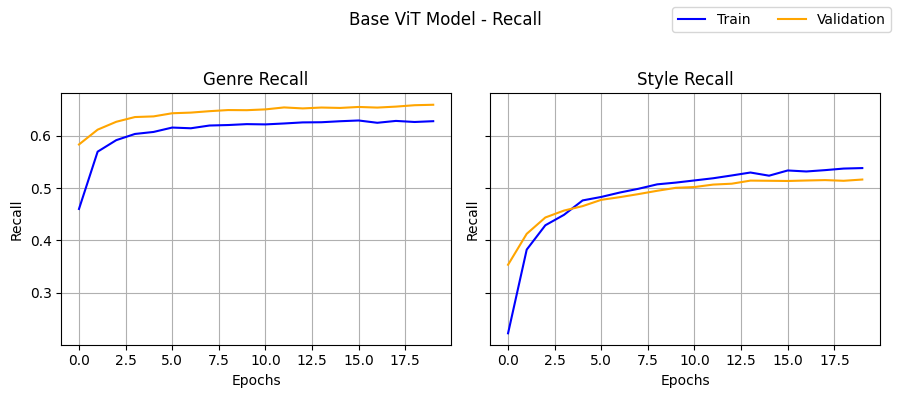

In [311]:
# getting recall score
aug_vitb16_recall_scores = pd.DataFrame(get_metrics(results=aug_vitb16_metrics, metric=Metric.RECALL))

# plot results
plot_metrics(results=aug_vitb16_recall_scores,
                             model_name="Base ViT",
                             metric=Metric.RECALL)

The model will find a little of 50% of the correct style labels.  

<h3>Predicting on Unseen Data</h3>

Next, I'll make predictions on a selection of random images from the test data. I must admit, visualizing how accurately these predictions match the ground truth is the most exciting part of the process.

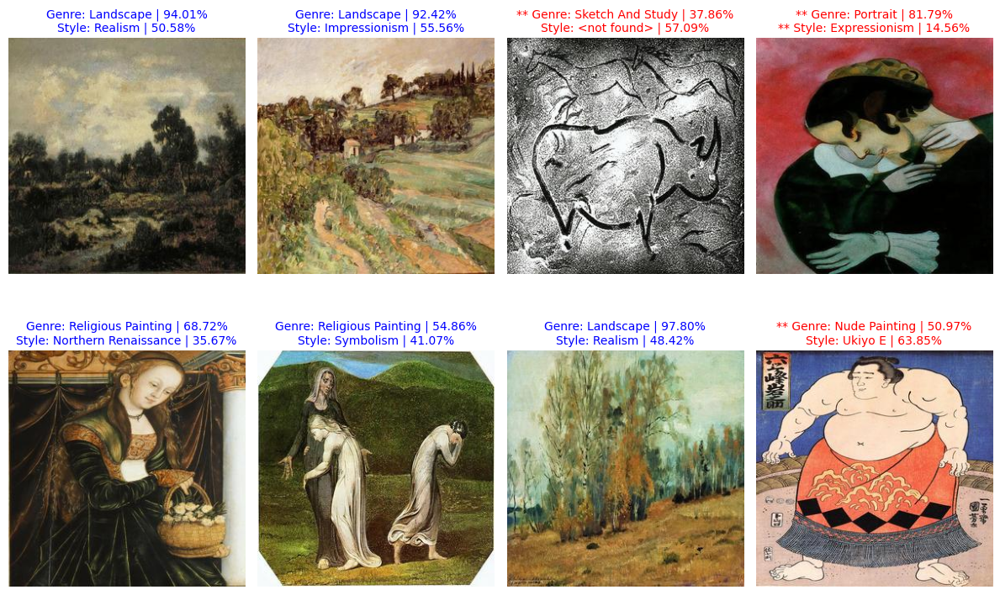

In [316]:
test_images = test_dir / 'images'

predict_random_test_images(model=aug_vitb16,
                           test_dir=test_images,
                           annotations_df=test_annotations,
                           transform=vit_transforms)

It's clearly has low confidence in the style label predictions.  But what's interesting are the missed genres which is sometihng I did not expect.

<h3>Collect Test Metrics</h3>

Feeding the model unseen data and collecting the loss, accuracy, f1 score, precision score, and recall score.  This will assist comparing the model to the others and deciding which is the best performing model.

In [317]:
metrics = evaluate_model(model=aug_vitb16,
                    model_name = 'aug_vitb16',
                    dataloader = test_dataloader,
                    device = device,
                    num_genres = len(genres))

temp_df = pd.DataFrame([metrics])
df_metrics = pd.concat([df_metrics, temp_df], ignore_index=True)
df_metrics.head()

Testing...: 100%|██████████| 204/204 [00:19<00:00, 10.27it/s]


,genre_accuracy,style_accuracy,genre_precision,style_precision,genre_recall,style_recall,genre_f1,style_f1,model_name
0,0.565157,0.387567,0.511124,0.336294,0.643357,0.488628,0.533271,0.352780,base_effnetb2
1,0.540752,0.354720,0.490573,0.315078,0.625849,0.464253,0.511842,0.322130,aug_effnetb2
2,0.610744,0.453262,0.554309,0.401147,0.676999,0.537276,0.582899,0.431382,base_vitb16
3,0.596777,0.430545,0.541912,0.394842,0.662462,0.524909,0.568971,0.415578,aug_vitb16


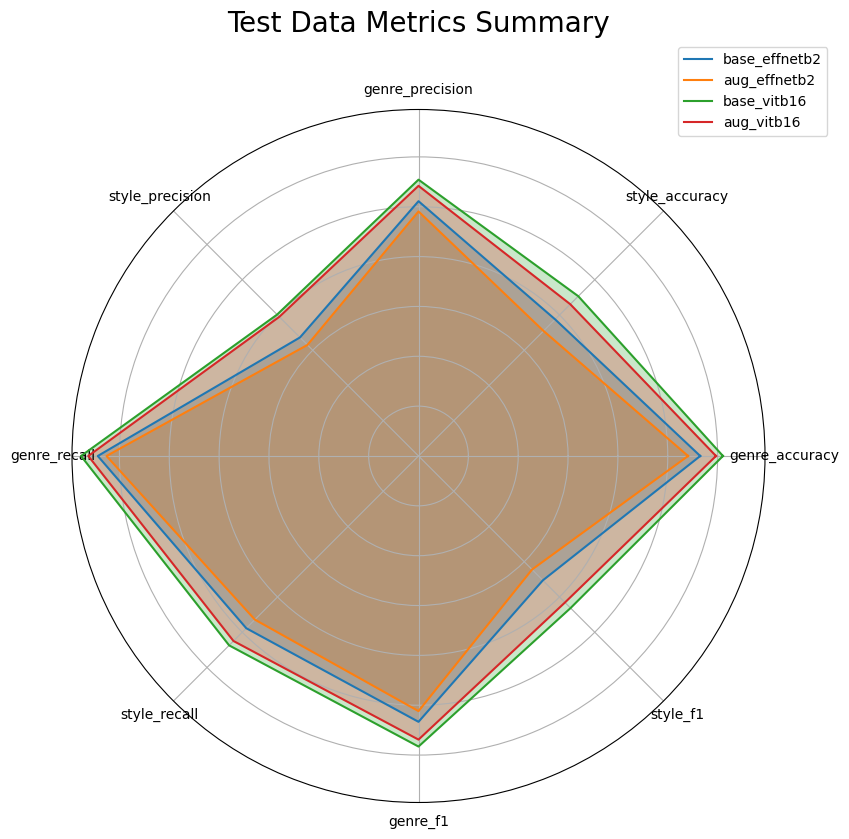

In [318]:
from math import pi
from matplotlib.patches import Patch

def radar_chart(df, metrics, title='Test Data Metrics Summary'):
    labels = metrics
    num_vars = len(labels)

    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    angles += angles[:1]

    fig, ax = plt.subplots(figsize=(9, 9), subplot_kw=dict(polar=True))
    ax.set_yticklabels([])

    for i, row in df.iterrows():
        values = row[metrics].tolist()
        values += values[:1]
        ax.plot(angles, values, label=row['model_name'])
        ax.fill(angles, values, alpha=0.25)

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels)
    ax.set_title(title, size=20, y=1.1)
    ax.legend(loc='upper right', bbox_to_anchor=(1.1, 1.1))

    plt.show()

# define metrics to be plotted
metric_labels = ['genre_accuracy', 'style_accuracy', 'genre_precision', 'style_precision',
           'genre_recall', 'style_recall', 'genre_f1', 'style_f1']

radar_chart(df_metrics, metric_labels)


### Summary

* According to the metrics in the plot above, the **base ViT model** is the best-performing model, although it appears to overfit on the training data.
* All models are trained on 100% of the data with 20 epochs.
* The data imbalance was addressed by balancing the weights, which improved performance.
* The ViT models outperform the EfficientNet models.
* The models perform exceptionally well at predicting genres.
* Predicting the artist was removed from the project due to limited data. While genres and styles are more generalized, predicting the artist's name requires significantly more data to achieve accuracy.




## Deploy
The plan includes saving the model to HuggingFace and creating a Gradio demo. That's right, Art Geek will be live! Let's go!





In [319]:
module_dir = Path('models/')
if not module_dir.is_dir():
  module_dir.mkdir(parents=True, exist_ok=True)

In [320]:

model_save_path = module_dir / 'base_vitb16.pth'

print(f"[INFO] Saving model to: {model_save_path}")
torch.save(obj=base_vitb16.state_dict(), f=model_save_path)

[INFO] Saving model to: models/base_vitb16.pth


In [321]:
# Import/install Gradio
try:
    import gradio as gr
except:
    !pip3 -qqq install gradio
    import gradio as gr

print(f"Gradio version: {gr.__version__}")

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 73.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 318.2/318.2 kB 26.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 141.1/141.1 kB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 80.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.2/92.2 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.9/71.9 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 11.8 MB/s eta 0:00:00
   ━━━━━━━

### Create Predict Function

In [322]:
# put model on the CPU
base_vitb16 = base_vitb16.to('cpu')

# check the device
next(iter(base_vitb16.parameters())).device

device(type='cpu')

In [352]:
from timeit import default_timer as timer

def predict(img) -> tuple[dict, dict, float]:
    start_time = timer()

    # Prepare the image
    img = vit_transforms(img).unsqueeze(0)  # Add batch dimension

    base_vitb16.eval()

    with torch.inference_mode():

        # make a prediction
        genre_logits, style_logits = base_vitb16(img)

        genre_probs = torch.softmax(genre_logits, dim=1)
        style_probs = torch.softmax(style_logits, dim=1)

    genre_pred_labels_and_probs = {genres[i]: float(genre_probs[0][i]) for i in range(len(genres))}
    style_pred_labels_and_probs = {styles[i]: float(style_probs[0][i]) for i in range(len(styles))}

    pred_time = round(timer() - start_time, 4)

    return genre_pred_labels_and_probs, style_pred_labels_and_probs, pred_time

In [353]:
import random
from PIL import Image

test_data_paths = list(Path(test_dir).glob('*/*.jpg'))

# radomly select a test image path
random_image_path = random.sample(test_data_paths, k=1)[0]

# open the target image
image = Image.open(random_image_path)

print(f'[INFO] Predicting on image at path: {random_image_path}\n')

# predict on the target image and print out the outputs
prediction = predict(img=image)

print(prediction)

[INFO] Predicting on image at path: dir/data/test/images/image_9208.jpg

({'Abstract Painting': 5.340095594874583e-05, 'Cityscape': 0.907870888710022, 'Genre Painting': 0.003115556202828884, 'Illustration': 0.0008535919478163123, 'Landscape': 0.07892061769962311, 'Nude Painting': 7.876690506236628e-05, 'Portrait': 6.256871711229905e-05, 'Religious Painting': 0.001164745190180838, 'Sketch And Study': 0.002049711998552084, 'Still Life': 5.153677921043709e-05, 'Unknown Genre': 0.00577870849519968}, {'Abstract Expressionism': 0.0003203484520781785, 'Action Painting': 5.560454519581981e-05, 'Analytical Cubism': 0.0007439869805239141, 'Art Nouveau': 0.006310099270194769, 'Baroque': 0.033623985946178436, 'Color Field Painting': 9.64892387855798e-05, 'Contemporary Realism': 0.00019507613615132868, 'Cubism': 0.0008966898312792182, 'Early Renaissance': 0.0010693507501855493, 'Expressionism': 0.014963064342737198, 'Fauvism': 0.0023601651191711426, 'High Renaissance': 0.0019356405828148127, 'Impre

Creating a list of example images

In [355]:
# Create list of example inputs to our Gradio demo
example_list = [[str(filepath)] for filepath in random.sample(test_data_paths, k=3)]
example_list

[['dir/data/test/images/image_16532.jpg'],
 ['dir/data/test/images/image_4240.jpg'],
 ['dir/data/test/images/image_14722.jpg']]

### Build Gradio Interface

In [356]:
import gradio as gr

title = 'Art Geek '
description = 'A [ViT Feature Extractor](https://pytorch.org/vision/main/models/generated/torchvision.models.vit_b_16.html) computer vision model to predict an art piece genre and style.'
article = 'Created at [Art Geek](https://github.com/AishaEvering/Art_Geek).'

# Create the Gradio demo
demo = gr.Interface(fn=predict, # maps inputs to outputs
                    inputs=gr.Image(type='pil'),
                    outputs=[gr.Label(num_top_classes=3, label="Genre"),
                             gr.Label(num_top_classes=3, label="Style"),
                             gr.Number(label="Prediction time (seconds)")],
                    examples=example_list,
                    title=title,
                    description=description,
                    article=article)

# Launch the demo!!!!
demo.launch(debug=True, share=True)

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
Running on public URL: https://569bd0fa1ce8f03f04.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7860 <> https://569bd0fa1ce8f03f04.gradio.live


### Create Demo Folder

In [343]:
import shutil
from pathlib import Path

art_geek_demo_path = Path('demo/art_geek/')

if art_geek_demo_path.exists():
  shutil.rmtree(art_geek_demo_path)

art_geek_demo_path.mkdir(parents=True, exist_ok=True)

!ls demo/art_geek/

### Create Folder for Example Images

In [344]:
import requests
import os

def download_custom_img(github_path: str, name: str, root, path: str = 'examples') -> None:

  full_path = root / path

  if full_path.exists():
      print(f"{full_path} directory exists, skipping re-download.")
  else:
      print(f"Did not find {full_path}, creating it...")
      full_path.mkdir(parents=True, exist_ok=True)

  custom_image_path = os.path.join(full_path, name)

  if not os.path.isfile(custom_image_path):
    with open(custom_image_path, "wb") as f:
      request = requests.get(github_path)
      print(f"Downloading {custom_image_path}...")
      f.write(request.content)
  else:
      print(f"{custom_image_path} already exists, skipping download...")

In [345]:
download_custom_img(github_path="https://github.com/AishaEvering/Art_Geek/blob/main/images/landscape.jpg?raw=true",
    root=art_geek_demo_path, name="beach.jpeg")

download_custom_img(github_path="https://github.com/AishaEvering/Art_Geek/blob/main/images/boats.jpg?raw=true",
    root=art_geek_demo_path, name="boats.jpeg")

download_custom_img(github_path="https://github.com/AishaEvering/Art_Geek/blob/main/images/portrait.jpg?raw=true",
    root=art_geek_demo_path, name="portrait.jpeg")

Did not find demo/art_geek/examples, creating it...
demo/art_geek/examples directory exists, skipping re-download.
demo/art_geek/examples directory exists, skipping re-download.


In [346]:
example_list = [['examples/' + example] for example in os.listdir(art_geek_demo_path / 'examples')]
example_list

[['examples/boats.jpeg'], ['examples/portrait.jpeg'], ['examples/beach.jpeg']]

In [347]:
import shutil

base_vitb16_path = 'models/base_vitb16.pth'

base_vitb16_model_destination = art_geek_demo_path / base_vitb16_path.split('/')[1]

try:
  print(f'[INFO] Attempting to mode {base_vitb16_path} to {base_vitb16_model_destination}')

  # Move the model
  shutil.move(src=base_vitb16_path, dst=base_vitb16_model_destination)

  print(f'[INFO] Model move complete.')
except:
  print(f'[INFO] No model found at {base_vitb16_path}, perhaps its already been moved?')
  print(f'[INFO] Model exists at {base_vitb16_model_destination} : {base_vitb16_model_destination.exists()}')

[INFO] Attempting to mode models/base_vitb16.pth to demo/art_geek/base_vitb16.pth
[INFO] Model move complete.


### Create model.py

In [348]:
%%writefile demo/art_geek/model.py
"""Contains function for creating a ViT model with a sigmoid layer added to the output to handle multi-label classification.
"""
import torch
from torch import nn
import torchvision
from torchvision.models import vit_b_16
from torchvision.models import ViT_B_16_Weights
from torchvision import transforms

class ViT_B_16_Model(nn.Module):
    def __init__(self, num_genres, num_styles):
        super(ViT_B_16_Model, self).__init__()

        # load the pre-trained ViT-B-16 model
        self.pretrained_model = torchvision.models.vit_b_16(weights=torchvision.models.ViT_B_16_Weights.DEFAULT)

        # freeze all layers in the pre-trained ViT-B-16 backbone
        for param in self.pretrained_model.parameters():
            param.requires_grad = False

        # Replace the classifier with a new one
        self.pretrained_model.heads = nn.Identity()

        self.dropout = nn.Dropout(p=0.3)

        # define separate heads for genre and style
        in_features = 768  # hardcoded based on ViT-B-16 model's output dimension
        self.genre_head = nn.Linear(in_features, num_genres)
        self.style_head = nn.Linear(in_features, num_styles)

    def forward(self, x):
        # pass input through the pre-trained model
        x = self.pretrained_model(x)
        x = self.dropout(x)

        # pass through genre and style heads
        genre = self.genre_head(x)
        style = self.style_head(x)

        return genre, style

Writing demo/art_geek/model.py


In [350]:
# from demo.art_geek import model

# vit_model = model.ViT_B_16_Model(num_genres=len(genres), num_styles=len(styles))
# vit_model

In [351]:
def save_class_names(class_names:list[str], file_path:str) -> None:
  with open(file_path, 'w') as file:
      for item in class_names:
          file.write(item + '\n')

save_class_names(genres, art_geek_demo_path / 'genres.txt')
save_class_names(styles, art_geek_demo_path / 'styles.txt')

### Create app.py

In [367]:
%%writefile demo/art_geek/app.py

import os
import torch
import gradio as gr
import torchvision

import model
from timeit import default_timer as timer


def get_class_names(file_name) -> None:
  with open(file_name, 'r') as file:
      return [line.strip() for line in file]

genres_class_names = get_class_names(file_name='genres.txt')
styles_class_names = get_class_names(file_name='styles.txt')

# model and transforms prep
vit_model = model.ViT_B_16_Model(num_genres=len(genres_class_names), num_styles=len(styles_class_names))

# load saved weights
vit_model.load_state_dict(
    torch.load(
        f='base_vitb16.pth',
        map_location=torch.device('cpu') #load the model to the cpu
    )
)


def predict(img) -> tuple[dict, dict, float]:
    start_time = timer()

    # Get pretrained weights for ViT-Base
    vit_transforms = torchvision.models.ViT_B_16_Weights.DEFAULT.transforms()

    # Prepare the image
    img = vit_transforms(img).unsqueeze(0)  # Add batch dimension

    vit_model.eval()

    with torch.inference_mode():

        # make a prediction
        genre_logits, style_logits = vit_model(img)

        genre_probs = torch.softmax(genre_logits, dim=1)
        style_probs = torch.softmax(style_logits, dim=1)

    genre_pred_labels_and_probs = {genres_class_names[i]: float(genre_probs[0][i]) for i in range(len(genres_class_names))}
    style_pred_labels_and_probs = {styles_class_names[i]: float(style_probs[0][i]) for i in range(len(styles_class_names))}

    pred_time = round(timer() - start_time, 4)

    return genre_pred_labels_and_probs, style_pred_labels_and_probs, pred_time

# create example list
example_list = [['examples/' + example] for example in os.listdir('examples')]

# create Gradio demo
import gradio as gr

title = 'Art Geek '
description = 'A [ViT Feature Extractor](https://pytorch.org/vision/main/models/generated/torchvision.models.vit_b_16.html) computer vision model to predict an art piece genre and style.'
article = 'Created at [Art Geek](https://github.com/AishaEvering/Art_Geek).'

# Create the Gradio demo
demo = gr.Interface(fn=predict, # maps inputs to outputs
                    inputs=gr.Image(type='pil'),
                    outputs=[gr.Label(num_top_classes=3, label="Genre"),
                             gr.Label(num_top_classes=3, label="Style"),
                             gr.Number(label="Prediction time (seconds)")],
                    examples=example_list,
                    title=title,
                    description=description,
                    article=article)

# Launch the demo!!!!
demo.launch(share=True)

Overwriting demo/art_geek/app.py


### Create Requirements File

In [358]:
%%writefile demo/art_geek/requirements.txt
torch==2.3.1
torchvision==0.18.1
gradio==4.36.1

Writing demo/art_geek/requirements.txt


### Create App Zip File

In [359]:
!ls demo/art_geek

app.py	base_vitb16.pth  examples  genres.txt  model.py  __pycache__  requirements.txt	styles.txt


In [360]:
# Change into the art_geek directory and then zip it from the inside
!cd demo/art_geek && zip -r ../art_geek.zip * -x "*.pyc" "*.ipynb" "*__pycache__*" "*ipynb_checkpoints*"

  adding: app.py (deflated 59%)
  adding: base_vitb16.pth (deflated 7%)
  adding: examples/ (stored 0%)
  adding: examples/boats.jpeg (deflated 0%)
  adding: examples/portrait.jpeg (deflated 0%)
  adding: examples/beach.jpeg (deflated 0%)
  adding: genres.txt (deflated 27%)
  adding: model.py (deflated 59%)
  adding: requirements.txt (deflated 6%)
  adding: styles.txt (deflated 45%)


### Download App Zip File

In [361]:
# Download
try:
  from google.colab import files
  files.download('demo/art_geek.zip')
except:
  print(f"Not running in Google Colab, can't use google.colab.files.download(), \
  please download art_geek.zip manually.")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Upload to Hugging Face Spaces

In [ ]:
# IPython is a library to help make Python interactive
from IPython.display import IFrame

# Embed FoodVision Mini Gradio demo
IFrame(src="https://aishae-foodvision-mini.hf.space", width=850, height=450)